In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
sns.set(style='darkgrid')
import matplotlib.pyplot as plt

In [2]:
import pandas as pd
data1 = pd.read_csv('Sisira/trial new/Monday-WorkingHours.pcap_ISCX.csv')
data2 = pd.read_csv('Sisira/trial new/Tuesday-WorkingHours.pcap_ISCX.csv')
data3 = pd.read_csv('Sisira/trial new/Wednesday-workingHours.pcap_ISCX.csv')
data4 = pd.read_csv('Sisira/trial new/Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv')
data5 = pd.read_csv('Sisira/trial new/Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv')
data6 = pd.read_csv('Sisira/trial new/Friday-WorkingHours-Morning.pcap_ISCX.csv')
data7 = pd.read_csv('Sisira/trial new/Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv')
data8 = pd.read_csv('Sisira/trial new/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv')
     

In [3]:
data_list = [data1, data2, data3, data4, data5, data6, data7, data8]

print('Data dimensions: ')
for i, data in enumerate(data_list, start = 1):
  rows, cols = data.shape
  print(f'Data{i} -> {rows} rows, {cols} columns')

Data dimensions: 
Data1 -> 529918 rows, 79 columns
Data2 -> 445909 rows, 79 columns
Data3 -> 692703 rows, 79 columns
Data4 -> 170366 rows, 79 columns
Data5 -> 288602 rows, 79 columns
Data6 -> 191033 rows, 79 columns
Data7 -> 286467 rows, 79 columns
Data8 -> 225745 rows, 79 columns


In [4]:
data = pd.concat(data_list)
rows, cols = data.shape

print('New dimension:')
print(f'Number of rows: {rows}')
print(f'Number of columns: {cols}')
print(f'Total cells: {rows * cols}')

New dimension:
Number of rows: 2830743
Number of columns: 79
Total cells: 223628697


In [5]:
# Deleting dataframes after concating to save memory
for d in data_list: del d

In [6]:
# Renaming the columns by removing leading/trailing whitespace
col_names = {col: col.strip() for col in data.columns}
data.rename(columns = col_names, inplace = True)

In [7]:
data.columns

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Co

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2830743 entries, 0 to 225744
Data columns (total 79 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Destination Port             int64  
 1   Flow Duration                int64  
 2   Total Fwd Packets            int64  
 3   Total Backward Packets       int64  
 4   Total Length of Fwd Packets  int64  
 5   Total Length of Bwd Packets  int64  
 6   Fwd Packet Length Max        int64  
 7   Fwd Packet Length Min        int64  
 8   Fwd Packet Length Mean       float64
 9   Fwd Packet Length Std        float64
 10  Bwd Packet Length Max        int64  
 11  Bwd Packet Length Min        int64  
 12  Bwd Packet Length Mean       float64
 13  Bwd Packet Length Std        float64
 14  Flow Bytes/s                 float64
 15  Flow Packets/s               float64
 16  Flow IAT Mean                float64
 17  Flow IAT Std                 float64
 18  Flow IAT Max                 int64  
 19  Flow I

In [9]:
pd.options.display.max_rows = 80

print('Overview of Columns:')
data.describe().transpose()

Overview of Columns:


/jupyter/dtids.user01/.local/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
/jupyter/dtids.user01/.local/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


,count,mean,std,min,25%,50%,75%,max
Destination Port,2830743.0,8.071483e+03,1.828363e+04,0.000000e+00,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,2830743.0,1.478566e+07,3.365374e+07,-1.300000e+01,155.000000,31316.000000,3.204828e+06,1.200000e+08
Total Fwd Packets,2830743.0,9.361160e+00,7.496728e+02,1.000000e+00,2.000000,2.000000,5.000000e+00,2.197590e+05
Total Backward Packets,2830743.0,1.039377e+01,9.973883e+02,0.000000e+00,1.000000,2.000000,4.000000e+00,2.919220e+05
Total Length of Fwd Packets,2830743.0,5.493024e+02,9.993589e+03,0.000000e+00,12.000000,62.000000,1.870000e+02,1.290000e+07
Total Length of Bwd Packets,2830743.0,1.616264e+04,2.263088e+06,0.000000e+00,0.000000,123.000000,4.820000e+02,6.554530e+08
Fwd Packet Length Max,2830743.0,2.075999e+02,7.171848e+02,0.000000e+00,6.000000,37.000000,8.100000e+01,2.482000e+04
Fwd Packet Length Min,2830743.0,1.871366e+01,6.033935e+01,0.000000e+00,0.000000,2.000000,3.600000e+01,2.325000e+03
Fwd Packet Length Mean,2830743.0,5.820194e+01,1.860912e+02,0.000000e+00,6.000000,34.000000,5.000000e+01,5.940857e+03
Fwd Packet Length Std,2830743.0,6.891013e+01,2.811871e+02,0.000000e+00,0.000000,0.000000,2.616295e+01,7.125597e+03


In [10]:
pd.options.display.max_columns = 80
data

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,49188,4,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,3.000000e+06,5.000000e+05,4.0,0.0,4,4,4,4.0,0.0,4,4,0,0.0,0.0,0,0,0,0,0,0,40,0,5.000000e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,4.000000e+06,6.666667e+05,3.0,0.0,3,3,3,3.0,0.0,3,3,0,0.0,0.0,0,0,0,0,0,0,40,0,6.666667e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,245,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225740,61374,61,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.967213e+05,3.278689e+04,61.0,0.0,61,61,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.639344e+04,16393.44262,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225741,61378,72,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.666667e+05,2.777778e+04,72.0,0.0,72,72,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.388889e+04,13888.88889,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225742,61375,75,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.600000e+05,2.666667e+04,75.0,0.0,75,75,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.333333e+04,13333.33333,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225743,61323,48,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,2.500000e+05,4.166667e+04,48.0,0.0,48,48,48,48.0,0.0,48,48,0,0.0,0.0,0,0,0,0,0,0,40,0,4.166667e+04,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,0,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,4719,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [11]:
#data cleaning
#identifying duplicate values
dups = data[data.duplicated()]
print(f'Number of duplicates: {len(dups)}')

Number of duplicates: 308381


In [12]:
data.drop_duplicates(inplace = True)
data.shape

(2522362, 79)

In [13]:
#identifying missing values
missing_val = data.isna().sum()
print(missing_val.loc[missing_val > 0])

Flow Bytes/s    353
dtype: int64


In [14]:
# Checking for infinity values
numeric_cols = data.select_dtypes(include = np.number).columns
inf_count = np.isinf(data[numeric_cols]).sum()
print(inf_count[inf_count > 0])

Flow Bytes/s      1211
Flow Packets/s    1564
dtype: int64


In [15]:
# Replacing any infinite values (positive or negative) with NaN (not a number)
print(f'Initial missing values: {data.isna().sum().sum()}')

data.replace([np.inf, -np.inf], np.nan, inplace = True)

print(f'Missing values after processing infinite values: {data.isna().sum().sum()}')

Initial missing values: 353
Missing values after processing infinite values: 3128


In [16]:
missing = data.isna().sum()
print(missing.loc[missing > 0])

Flow Bytes/s      1564
Flow Packets/s    1564
dtype: int64


In [17]:
# Calculating missing value percentage in the dataset
mis_per = (missing / len(data)) * 100
mis_table = pd.concat([missing, mis_per.round(2)], axis = 1)
mis_table = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

print(mis_table.loc[mis_per > 0])

                Missing Values  Percentage of Total Values
Flow Bytes/s              1564                        0.06
Flow Packets/s            1564                        0.06


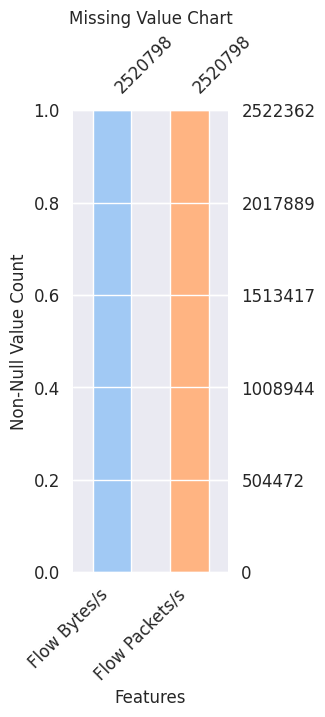

In [18]:
#Visualization of missing data
sns.set_palette('pastel')
colors = sns.color_palette()

missing_vals = [col for col in data.columns if data[col].isna().any()]

fig, ax = plt.subplots(figsize = (2, 6))
msno.bar(data[missing_vals], ax = ax, fontsize = 12, color = colors)
ax.set_xlabel('Features', fontsize = 12)
ax.set_ylabel('Non-Null Value Count', fontsize = 12)
ax.set_title('Missing Value Chart', fontsize = 12)
plt.show()

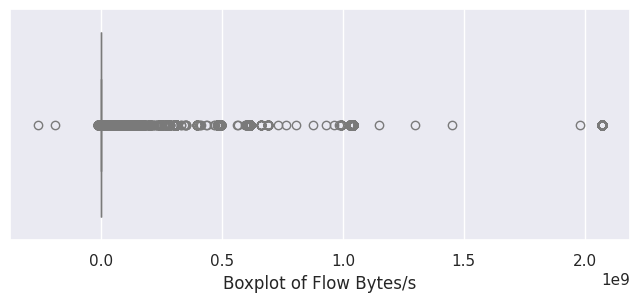

In [19]:
#Dealing with missing values (Columns with missing data)
import matplotlib.pyplot as plt
import seaborn as sns

# Drop missing or non-numeric values
data['Flow Bytes/s'] = pd.to_numeric(data['Flow Bytes/s'], errors='coerce')
data = data.dropna(subset=['Flow Bytes/s'])

# Reset index to handle any duplicate indices
data = data.reset_index(drop=True)

# Plot the boxplot
plt.figure(figsize=(8, 3))
sns.boxplot(x=data['Flow Bytes/s'])
plt.xlabel('Boxplot of Flow Bytes/s')
plt.show()


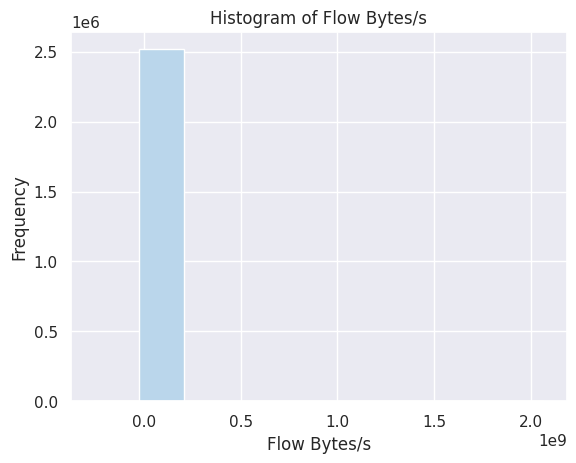

In [20]:
colors = sns.color_palette('Blues')
plt.hist(data['Flow Bytes/s'], color = colors[1])
plt.title('Histogram of Flow Bytes/s')
plt.xlabel('Flow Bytes/s')
plt.ylabel('Frequency')
plt.show()

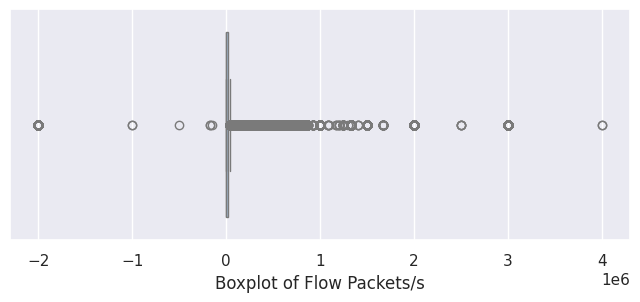

In [21]:
plt.figure(figsize = (8, 3))
sns.boxplot(x = data['Flow Packets/s'])
plt.xlabel('Boxplot of Flow Packets/s')
plt.show()

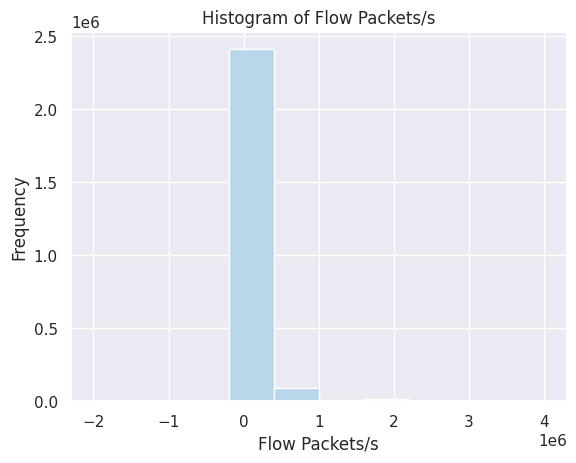

In [22]:
plt.hist(data['Flow Packets/s'], color = colors[1])
plt.title('Histogram of Flow Packets/s')
plt.xlabel('Flow Packets/s')
plt.ylabel('Frequency')
plt.show()

In [23]:
med_flow_bytes = data['Flow Bytes/s'].median()
med_flow_packets = data['Flow Packets/s'].median()

print('Median of Flow Bytes/s: ', med_flow_bytes)
print('Median of Flow Packets/s: ', med_flow_packets)

Median of Flow Bytes/s:  3715.0378579999997
Median of Flow Packets/s:  69.742244285


In [24]:
# Filling missing values with median
data['Flow Bytes/s'] = data['Flow Bytes/s'].fillna(med_flow_bytes)
data['Flow Packets/s'] = data['Flow Packets/s'].fillna(med_flow_packets)

# Optional: Verify there are no missing values left in these columns
print(f"Missing values in 'Flow Bytes/s': {data['Flow Bytes/s'].isnull().sum()}")
print(f"Missing values in 'Flow Packets/s': {data['Flow Packets/s'].isnull().sum()}")


Missing values in 'Flow Bytes/s': 0
Missing values in 'Flow Packets/s': 0


In [25]:
data['Label'].unique()

array(['BENIGN', 'FTP-Patator', 'SSH-Patator', 'DoS slowloris',
       'DoS Slowhttptest', 'DoS Hulk', 'DoS GoldenEye', 'Heartbleed',
       'Web Attack � Brute Force', 'Web Attack � XSS',
       'Web Attack � Sql Injection', 'Infiltration', 'Bot', 'PortScan',
       'DDoS'], dtype=object)

In [26]:
# Types of attacks & normal instances (BENIGN)
data['Label'].value_counts()

Label
BENIGN                        2095057
DoS Hulk                       172846
DDoS                           128014
PortScan                        90694
DoS GoldenEye                   10286
FTP-Patator                      5931
DoS slowloris                    5385
DoS Slowhttptest                 5228
SSH-Patator                      3219
Bot                              1948
Web Attack � Brute Force         1470
Web Attack � XSS                  652
Infiltration                       36
Web Attack � Sql Injection         21
Heartbleed                         11
Name: count, dtype: int64

In [27]:
# Creating a dictionary that maps each label to its attack type
attack_map = {
    'BENIGN': 'BENIGN',
    'DDoS': 'DDoS',
    'DoS Hulk': 'DoS',
    'DoS GoldenEye': 'DoS',
    'DoS slowloris': 'DoS',
    'DoS Slowhttptest': 'DoS',
    'PortScan': 'Port Scan',
    'FTP-Patator': 'Brute Force',
    'SSH-Patator': 'Brute Force',
    'Bot': 'Bot',
    'Web Attack � Brute Force': 'Web Attack',
    'Web Attack � XSS': 'Web Attack',
    'Web Attack � Sql Injection': 'Web Attack',
    'Infiltration': 'Infiltration',
    'Heartbleed': 'Heartbleed'
}

# Creating a new column 'Attack Type' in the DataFrame based on the attack_map dictionary
data['Attack Type'] = data['Label'].map(attack_map)
data['Attack Type'].value_counts()

Attack Type
BENIGN          2095057
DoS              193745
DDoS             128014
Port Scan         90694
Brute Force        9150
Web Attack         2143
Bot                1948
Infiltration         36
Heartbleed           11
Name: count, dtype: int64

In [28]:
data.drop('Label', axis = 1, inplace = True)

In [29]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
data['Attack Number'] = le.fit_transform(data['Attack Type'])

print(data['Attack Number'].unique())

[0 2 4 5 8 6 1 7 3]


In [30]:
# Printing corresponding attack type for each encoded value
encoded_values = data['Attack Number'].unique()
for val in sorted(encoded_values):
    print(f"{val}: {le.inverse_transform([val])[0]}")

0: BENIGN
1: Bot
2: Brute Force
3: DDoS
4: DoS
5: Heartbleed
6: Infiltration
7: Port Scan
8: Web Attack


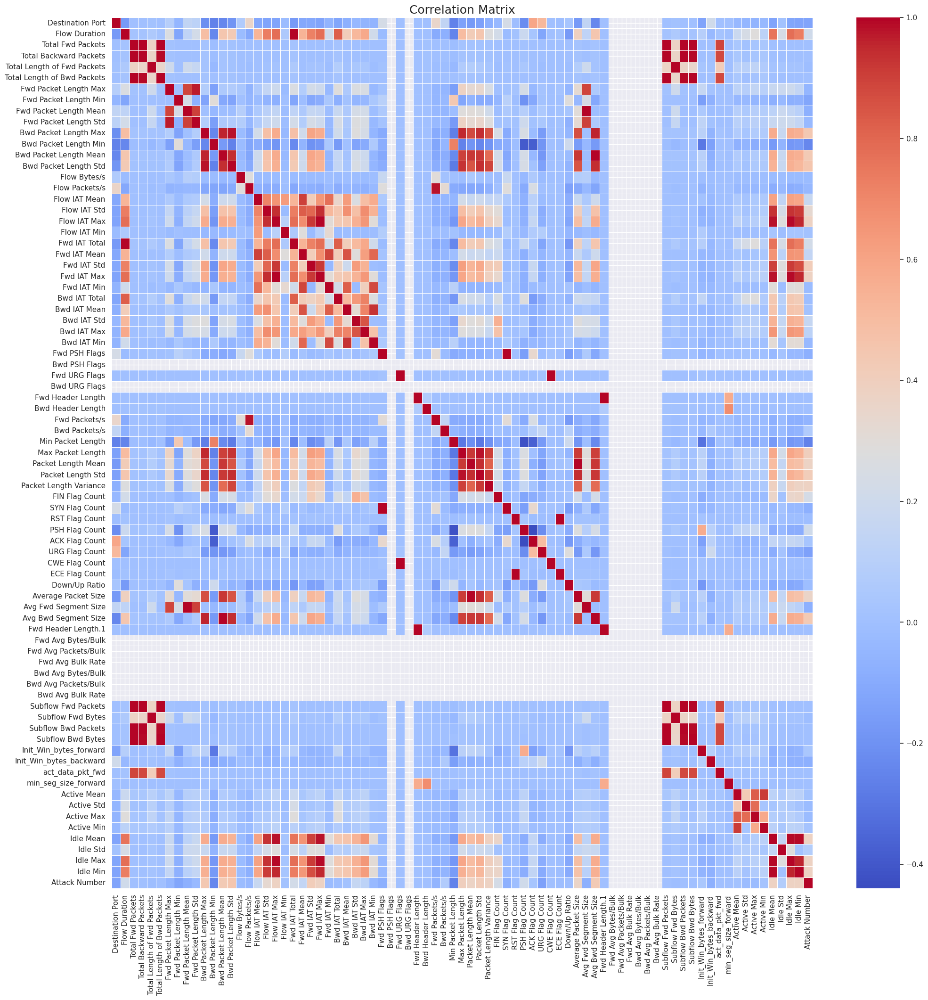

In [31]:
corr = data.corr(numeric_only = True).round(2)
corr.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)
fig, ax = plt.subplots(figsize = (24, 24))
sns.heatmap(corr, cmap = 'coolwarm', annot = False, linewidth = 0.5)
plt.title('Correlation Matrix', fontsize = 18)
plt.show()

In [32]:
# Positive correlation features for 'Attack Number'
pos_corr_features = corr['Attack Number'][(corr['Attack Number'] > 0) & (corr['Attack Number'] < 1)].index.tolist()

print("Features with positive correlation with 'Attack Number':\n")
for i, feature in enumerate(pos_corr_features, start = 1):
    corr_value = corr.loc[feature, 'Attack Number']
    print('{:<3} {:<24} :{}'.format(f'{i}.', feature, corr_value))

Features with positive correlation with 'Attack Number':

1.  Flow Duration            :0.21
2.  Bwd Packet Length Max    :0.44
3.  Bwd Packet Length Mean   :0.43
4.  Bwd Packet Length Std    :0.45
5.  Flow IAT Mean            :0.17
6.  Flow IAT Std             :0.33
7.  Flow IAT Max             :0.38
8.  Flow IAT Min             :0.01
9.  Fwd IAT Total            :0.22
10. Fwd IAT Mean             :0.15
11. Fwd IAT Std              :0.41
12. Fwd IAT Max              :0.38
13. Bwd IAT Mean             :0.01
14. Bwd IAT Std              :0.16
15. Bwd IAT Max              :0.12
16. Bwd Packets/s            :0.07
17. Max Packet Length        :0.4
18. Packet Length Mean       :0.37
19. Packet Length Std        :0.41
20. Packet Length Variance   :0.38
21. FIN Flag Count           :0.23
22. PSH Flag Count           :0.21
23. ACK Flag Count           :0.03
24. Average Packet Size      :0.36
25. Avg Bwd Segment Size     :0.43
26. Init_Win_bytes_forward   :0.04
27. Active Mean              :0.0

In [33]:
print(f'Number of considerable important features: {len(pos_corr_features)}')

Number of considerable important features: 32


In [34]:
# Checking for columns with zero standard deviation (the blank squares in the heatmap)
std = data.std(numeric_only = True)
zero_std_cols = std[std == 0].index.tolist()
zero_std_cols

['Bwd PSH Flags',
 'Bwd URG Flags',
 'Fwd Avg Bytes/Bulk',
 'Fwd Avg Packets/Bulk',
 'Fwd Avg Bulk Rate',
 'Bwd Avg Bytes/Bulk',
 'Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate']

In [35]:
# Data sampling for data analysis
sample_size = int(0.2 * len(data)) # 20% of the original size
sampled_data = data.sample(n = sample_size, replace = False, random_state = 0)
sampled_data.shape

(504159, 80)

In [36]:
# To assess if a sample is representative of the population and comparison of descriptive statistics (mean)
numeric_cols = data.select_dtypes(include = [np.number]).columns.tolist()
print('Descriptive Statistics Comparison (mean):\n')
print('{:<32s}{:<22s}{:<22s}{}'.format('Feature', 'Original Dataset', 'Sampled Dataset', 'Variation Percentage'))
print('-' * 96)

high_variations = []
for col in numeric_cols:
    old = data[col].describe()[1]
    new = sampled_data[col].describe()[1]
    if old == 0:
        pct = 0
    else:
        pct = abs((new - old) / old)
    if pct * 100 > 5:
        high_variations.append((col, pct * 100))
    print('{:<32s}{:<22.6f}{:<22.6f}{:<2.2%}'.format(col, old, new, pct))

Descriptive Statistics Comparison (mean):

Feature                         Original Dataset      Sampled Dataset       Variation Percentage
------------------------------------------------------------------------------------------------
Destination Port                8690.590448           8696.538088           0.07%
Flow Duration                   16591611.463958       16576634.770182       0.09%
Total Fwd Packets               10.281742             7.767097              24.46%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Total Backward Packets          11.572804             8.187437              29.25%
Total Length of Fwd Packets     611.947675            592.653459            3.15%
Total Length of Bwd Packets     18144.402452          10658.373220          41.26%
Fwd Packet Length Max           231.229173            231.394542            0.07%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Fwd Packet Length Min           19.203488             19.308066             0.54%
Fwd Packet Length Mean          63.504966             63.566810             0.10%
Fwd Packet Length Std           77.323474             77.282736             0.05%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Bwd Packet Length Max           974.972586            970.330959            0.48%
Bwd Packet Length Min           43.159451             43.161620             0.01%
Bwd Packet Length Mean          340.622476            339.322840            0.38%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Bwd Packet Length Std           376.545289            374.527594            0.54%
Flow Bytes/s                    1410706.951183        1397785.136764        0.92%
Flow Packets/s                  47291.883534          47495.137833          0.43%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Flow IAT Mean                   1446142.283581        1443705.688652        0.17%
Flow IAT Std                    3278152.634148        3270879.143653        0.22%
Flow IAT Max                    10299484.926106       10266312.574105       0.32%
Flow IAT Min                    170421.369036         169377.056534         0.61%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Fwd IAT Total                   16251836.019271       16235310.753020       0.10%
Fwd IAT Mean                    2919257.240484        2919817.606427        0.02%
Fwd IAT Std                     3668640.620038        3653727.842698        0.41%


/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ trea

Fwd IAT Max                     10142935.423475       10108765.360870       0.34%
Fwd IAT Min                     1135670.930763        1141505.706317        0.51%
Bwd IAT Total                   11110247.474341       11154507.200788       0.40%
Bwd IAT Mean                    2027734.224264        2039323.404835        0.57%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Bwd IAT Std                     1668681.362524        1678745.365652        0.60%
Bwd IAT Max                     5260619.416653        5278890.803848        0.35%
Bwd IAT Min                     1086111.214869        1089925.813424        0.35%
Fwd PSH Flags                   0.048668              0.048685              0.03%
Bwd PSH Flags                   0.000000              0.000000              0.00%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Fwd URG Flags                   0.000032              0.000038              18.75%
Bwd URG Flags                   0.000000              0.000000              0.00%
Fwd Header Length               -29200.228900         -81465.325867         178.99%
Bwd Header Length               -2555.236279          -792.654238           68.98%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Fwd Packets/s                   40859.688446          41122.420744          0.64%
Bwd Packets/s                   6513.513456           6440.156132           1.13%
Min Packet Length               16.832002             16.850000             0.11%
Max Packet Length               1063.750164           1059.875077           0.36%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Packet Length Mean              190.654775            190.175015            0.25%
Packet Length Std               330.200630            329.020376            0.36%
Packet Length Variance          545776.080656         543020.209857         0.50%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

FIN Flag Count                  0.032095              0.032016              0.25%
SYN Flag Count                  0.048668              0.048685              0.03%
RST Flag Count                  0.000272              0.000276              1.31%
PSH Flag Count                  0.297609              0.297569              0.01%
ACK Flag Count                  0.311872              0.312048              0.06%
URG Flag Count                  0.101393              0.101410              0.02%
CWE Flag Count                  0.000032              0.000038              18.75%


/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ trea

ECE Flag Count                  0.000273              0.000278              1.60%
Down/Up Ratio                   0.700448              0.699636              0.12%
Average Packet Size             212.435777            211.898574            0.25%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Avg Fwd Segment Size            63.504966             63.566810             0.10%
Avg Bwd Segment Size            340.622476            339.322840            0.38%
Fwd Header Length.1             -29200.228900         -81465.325867         178.99%
Fwd Avg Bytes/Bulk              0.000000              0.000000              0.00%
Fwd Avg Packets/Bulk            0.000000              0.000000              0.00%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Fwd Avg Bulk Rate               0.000000              0.000000              0.00%
Bwd Avg Bytes/Bulk              0.000000              0.000000              0.00%
Bwd Avg Packets/Bulk            0.000000              0.000000              0.00%
Bwd Avg Bulk Rate               0.000000              0.000000              0.00%
Subflow Fwd Packets             10.281742             7.767097              24.46%
Subflow Fwd Bytes               611.935908            592.653459            3.15%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

Subflow Bwd Packets             11.572804             8.187437              29.25%
Subflow Bwd Bytes               18144.020559          10658.421314          41.26%
Init_Win_bytes_forward          7265.614202           7244.530725           0.29%
Init_Win_bytes_backward         2228.725357           2224.712363           0.18%
act_data_pkt_fwd                6.009478              3.722098              38.06%


/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ trea

min_seg_size_forward            -3082.233225          -2935.836470          4.75%
Active Mean                     91578.472746          89719.088696          2.03%
Active Std                      46191.766703          46566.229480          0.81%
Active Max                      172017.095242         170840.305447         0.68%
Active Min                      65463.586473          63418.730115          3.12%


/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ trea

Idle Mean                       9337367.180644        9316740.515441        0.22%
Idle Std                        565794.138971         562880.349681         0.51%
Idle Max                        9763770.482253        9740744.781406        0.24%
Idle Min                        8892670.653693        8874216.083301        0.21%
Attack Number                   0.726573              0.727584              0.14%


/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new = sampled_data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  old = data[col].describe()[1]
/tmp/ipykernel_967520/580325769.py:10: FutureWarning: Series.__getitem__ treating key

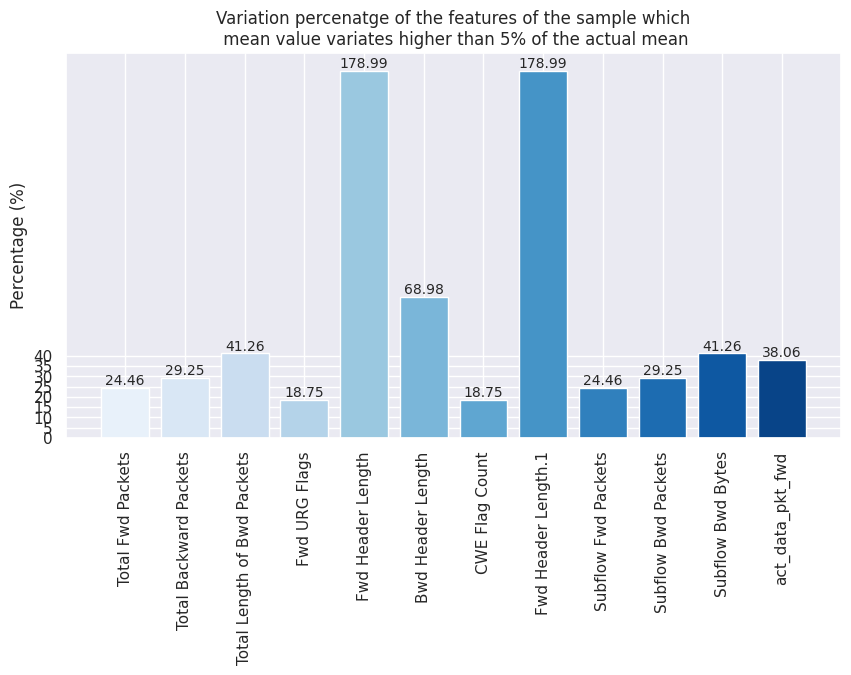

In [37]:
labels = [t[0] for t in high_variations]
values = [t[1] for t in high_variations]

colors = sns.color_palette('Blues', n_colors=len(labels))
fig, ax = plt.subplots(figsize = (10, 5))
ax.bar(labels, values, color = colors)

for i in range(len(labels)):
    ax.text(i, values[i], str(round(values[i], 2)), ha = 'center', va = 'bottom', fontsize = 10)

plt.xticks(rotation = 90)
ax.set_title('Variation percenatge of the features of the sample which\n mean value variates higher than 5% of the actual mean')
ax.set_ylabel('Percentage (%)')
ax.set_yticks(np.arange(0, 41, 5))
plt.show()

In [38]:
# Printing the unique value count
indent = '{:<3} {:<30}: {}'
print('Unique value count for: ')
for i, feature in enumerate(list(sampled_data.columns)[:-1], start = 1):
    print(indent.format(f'{i}.', feature, sampled_data[feature].nunique()))

Unique value count for: 
1.  Destination Port              : 33464
2.  Flow Duration                 : 256239
3.  Total Fwd Packets             : 649
4.  Total Backward Packets        : 830
5.  Total Length of Fwd Packets   : 9052
6.  Total Length of Bwd Packets   : 24055
7.  Fwd Packet Length Max         : 3656
8.  Fwd Packet Length Min         : 245
9.  Fwd Packet Length Mean        : 35043
10. Fwd Packet Length Std         : 66223
11. Bwd Packet Length Max         : 3909
12. Bwd Packet Length Min         : 439
13. Bwd Packet Length Mean        : 45549
14. Bwd Packet Length Std         : 62692
15. Flow Bytes/s                  : 346494
16. Flow Packets/s                : 288101
17. Flow IAT Mean                 : 273895
18. Flow IAT Std                  : 229259
19. Flow IAT Max                  : 167444
20. Flow IAT Min                  : 46195
21. Fwd IAT Total                 : 119756
22. Fwd IAT Mean                  : 164304
23. Fwd IAT Std                   : 148378
24. Fwd IAT

In [39]:
# Original dataset size
print(f"Original dataset size: {len(data)}")

# Calculated sample size
sample_size = int(0.2 * len(data))
print(f"Calculated sample size: {sample_size}")

# Sampled dataset size
sampled_data = data.sample(n=sample_size, replace=False, random_state=0)
print(f"Sampled dataset size: {sampled_data.shape[0]}")

# Compare missing values and check for preprocessing
print(data.isnull().sum())


Original dataset size: 2520798
Calculated sample size: 504159
Sampled dataset size: 504159
Destination Port               0
Flow Duration                  0
Total Fwd Packets              0
Total Backward Packets         0
Total Length of Fwd Packets    0
Total Length of Bwd Packets    0
Fwd Packet Length Max          0
Fwd Packet Length Min          0
Fwd Packet Length Mean         0
Fwd Packet Length Std          0
Bwd Packet Length Max          0
Bwd Packet Length Min          0
Bwd Packet Length Mean         0
Bwd Packet Length Std          0
Flow Bytes/s                   0
Flow Packets/s                 0
Flow IAT Mean                  0
Flow IAT Std                   0
Flow IAT Max                   0
Flow IAT Min                   0
Fwd IAT Total                  0
Fwd IAT Mean                   0
Fwd IAT Std                    0
Fwd IAT Max                    0
Fwd IAT Min                    0
Bwd IAT Total                  0
Bwd IAT Mean                   0
Bwd IAT Std       

In [40]:
# Data sampling for data analysis
sample_size = int(0.2 * len(data)) # 20% of the original size
sampled_data = data.sample(n = sample_size, replace = False, random_state = 0)
sampled_data.shape

(504159, 80)

In [41]:
print(f"Dataset length: {len(data)}")


Dataset length: 2520798


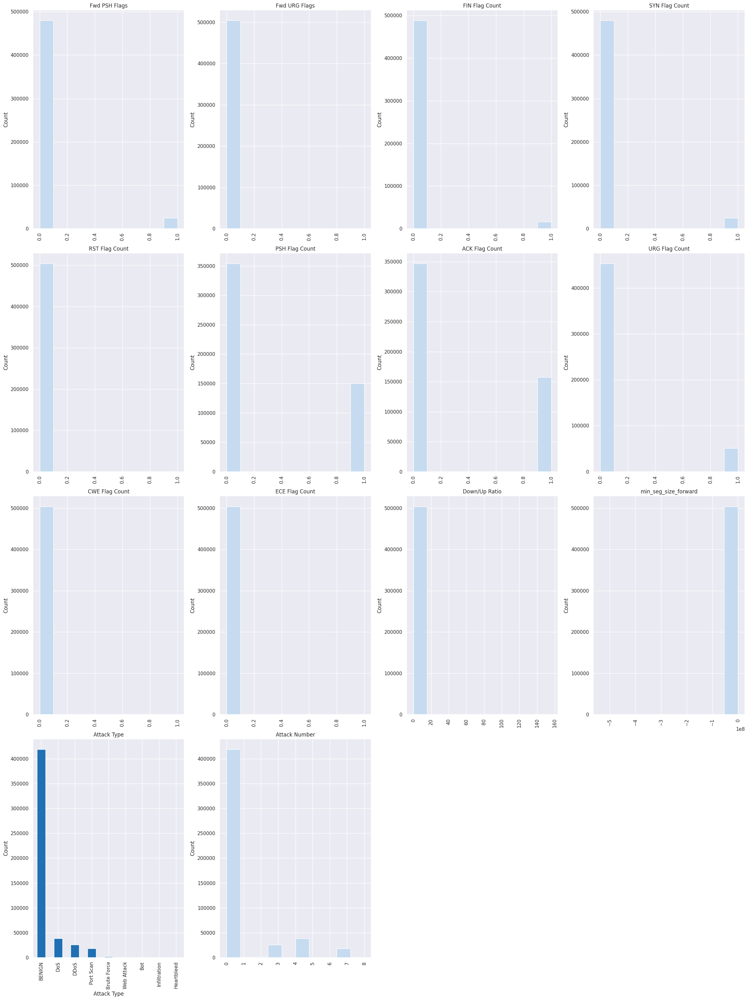

In [42]:
'''Generating a set of visualizations for columns that have more than one unique value but less than 50 unique values.
For categorical columns, a bar plot is generated showing the count of each unique value.
For numerical columns, a histogram is generated.'''
unique_values = sampled_data.nunique()
selected_cols = sampled_data[[col for col in sampled_data if 1 < unique_values[col] < 50]]
rows, cols = selected_cols.shape
col_names = list(selected_cols)
num_of_rows = (cols + 3) // 4

color_palette = sns.color_palette('Blues', n_colors = 3)
plt.figure(figsize = (6 * 4, 8 * num_of_rows))

for i in range(cols):
    plt.subplot(num_of_rows, 4, i + 1)
    col_data = selected_cols.iloc[:, i]
    if col_data.dtype.name == 'object':
        col_data.value_counts().plot(kind = 'bar', color = color_palette[2])
    else:
        col_data.hist(color = color_palette[0])

    plt.ylabel('Count')
    plt.xticks(rotation = 90)
    plt.title(col_names[i])

plt.tight_layout()
plt.show()

In [43]:
# Correlation matrix for sampled data
corr_matrix = sampled_data.corr(numeric_only = True).round(2)
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

/jupyter/dtids.user01/.local/lib/python3.9/site-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/jupyter/dtids.user01/.local/lib/python3.9/site-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


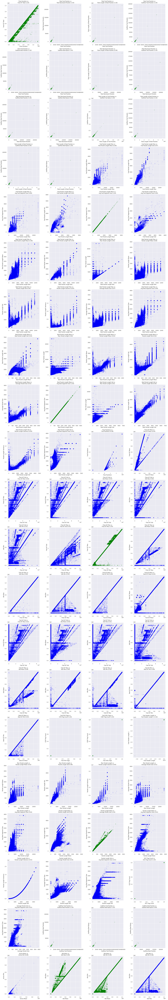

In [44]:
# Plotting the pairs of strongly positive correlated features in the sampled_data that have a correlation coefficient of 0.85 or higher
cols = list(sampled_data.columns)[:-2]
high_corr_pairs = []
corr_th = 0.85

for i in range(len(cols)):
  for j in range(i + 1, len(cols)):
    val = sampled_data[cols[i]].corr(sampled_data[cols[j]])
    # If the correlation coefficient is NaN or below the threshold, skip to the next pair
    if np.isnan(val) or val < corr_th:
      continue
    high_corr_pairs.append((val, cols[i], cols[j]))

size, cols = len(high_corr_pairs), 4
rows, rem =  size // cols, size % cols
if rem:
  rows += 1

fig, axs = plt.subplots(rows, cols, figsize = (24, int(size * 1.7)))
for i in range(rows):
    for j in range(cols):
      try:
        val, x, y = high_corr_pairs[i * cols + j]
        if val > 0.99:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'green', alpha = 0.1)
        else:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'blue', alpha = 0.1)
        axs[i, j].set_xlabel(x)
        axs[i, j].set_ylabel(y)
        axs[i, j].set_title(f'{x} vs\n{y} ({val:.2f})')
      except IndexError:
        fig.delaxes(axs[i, j])

fig.tight_layout()
plt.show()

In [45]:
sampled_data.drop('Attack Number', axis = 1, inplace = True)
data.drop('Attack Number', axis = 1, inplace = True)

In [46]:
# Identifying outliers
numeric_data = sampled_data.select_dtypes(include = ['float', 'int'])
q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1
outlier = (numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))
outlier_count = outlier.sum()
outlier_percentage = round(outlier.mean() * 100, 2)
outlier_stats = pd.concat([outlier_count, outlier_percentage], axis = 1)
outlier_stats.columns = ['Outlier Count', 'Outlier Percentage']

print(outlier_stats)

                             Outlier Count  Outlier Percentage
Destination Port                    109365               21.69
Flow Duration                        93379               18.52
Total Fwd Packets                    50676               10.05
Total Backward Packets               47938                9.51
Total Length of Fwd Packets          62950               12.49
Total Length of Bwd Packets         114829               22.78
Fwd Packet Length Max                48959                9.71
Fwd Packet Length Min                 2682                0.53
Fwd Packet Length Mean               35427                7.03
Fwd Packet Length Std                47499                9.42
Bwd Packet Length Max                74683               14.81
Bwd Packet Length Min                13178                2.61
Bwd Packet Length Mean               87195               17.30
Bwd Packet Length Std                89778               17.81
Flow Bytes/s                         94979             

In [47]:
# Identifying outliers based on attack type
outlier_counts = {}
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        attack_data = sampled_data[i][sampled_data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[(i, attack_type)] = (num_outliers, outlier_percent)

for i in numeric_data:
  print(f'Feature: {i}')
  for attack_type in sampled_data['Attack Type'].unique():
    num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
    print(f'- {attack_type}: {num_outliers} ({outlier_percent:.2f}%)')
  print()

Feature: Destination Port
- BENIGN: 93800 (22.38%)
- DoS: 0 (0.00%)
- DDoS: 0 (0.00%)
- Port Scan: 2219 (12.11%)
- Web Attack: 0 (0.00%)
- Brute Force: 0 (0.00%)
- Bot: 129 (34.49%)
- Infiltration: 0 (0.00%)
- Heartbleed: 0 (0.00%)

Feature: Flow Duration
- BENIGN: 97266 (23.21%)
- DoS: 8464 (21.97%)
- DDoS: 4287 (16.76%)
- Port Scan: 418 (2.28%)
- Web Attack: 67 (15.16%)
- Brute Force: 0 (0.00%)
- Bot: 1 (0.27%)
- Infiltration: 0 (0.00%)
- Heartbleed: 0 (0.00%)

Feature: Total Fwd Packets
- BENIGN: 78071 (18.63%)
- DoS: 483 (1.25%)
- DDoS: 782 (3.06%)
- Port Scan: 290 (1.58%)
- Web Attack: 68 (15.38%)
- Brute Force: 0 (0.00%)
- Bot: 11 (2.94%)
- Infiltration: 2 (25.00%)
- Heartbleed: 0 (0.00%)

Feature: Total Backward Packets
- BENIGN: 60291 (14.39%)
- DoS: 4370 (11.34%)
- DDoS: 0 (0.00%)
- Port Scan: 94 (0.51%)
- Web Attack: 34 (7.69%)
- Brute Force: 0 (0.00%)
- Bot: 11 (2.94%)
- Infiltration: 2 (25.00%)
- Heartbleed: 0 (0.00%)

Feature: Total Length of Fwd Packets
- BENIGN: 81230 (1

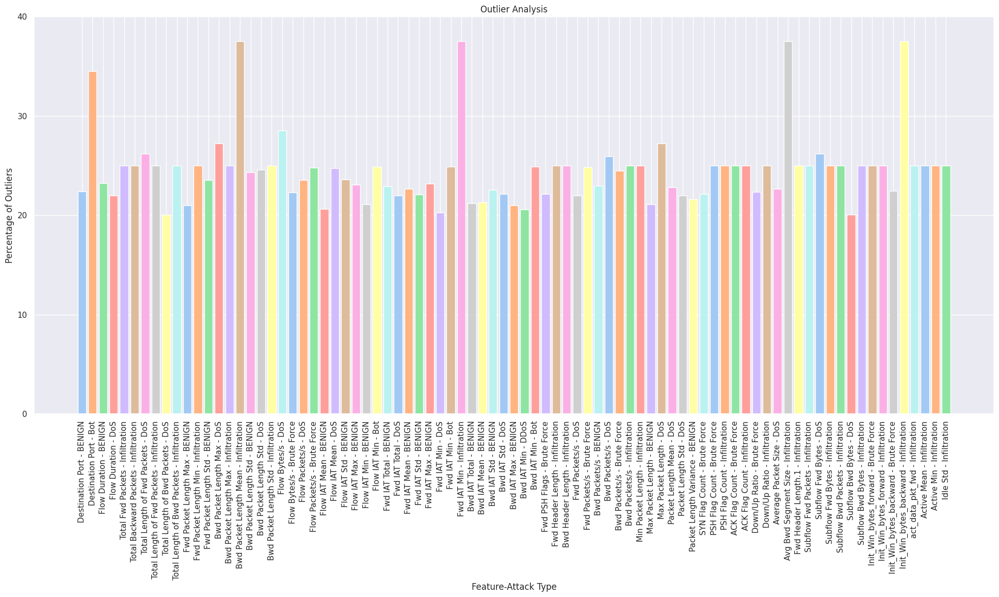

In [48]:
# Plotting the percentage of outliers that are higher than 20%
fig, ax = plt.subplots(figsize = (24, 10))
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
        if outlier_percent > 20:
            ax.bar(f'{i} - {attack_type}', outlier_percent)

ax.set_xlabel('Feature-Attack Type')
ax.set_ylabel('Percentage of Outliers')
ax.set_title('Outlier Analysis')
ax.set_yticks(np.arange(0, 41, 10))
plt.xticks(rotation = 90)
plt.show()

/tmp/ipykernel_967520/323780027.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)


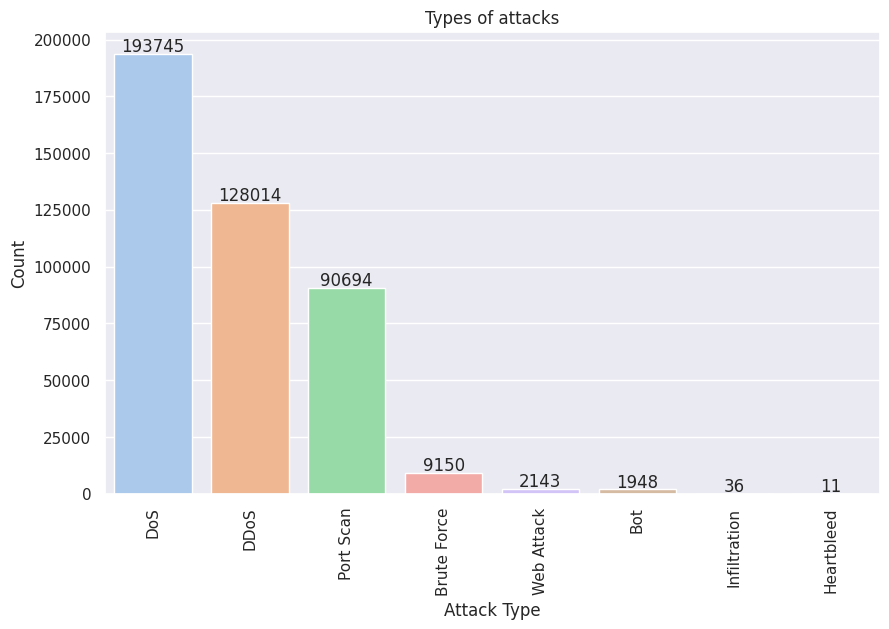

In [49]:
# Different 'Attack Type' in the main dataset excluding 'BENIGN'
attacks = data.loc[data['Attack Type'] != 'BENIGN']

plt.figure(figsize = (10, 6))
ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)
plt.title('Types of attacks')
plt.xlabel('Attack Type')
plt.ylabel('Count')
plt.xticks(rotation = 90)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height() + 1000), ha = 'center')

plt.show()

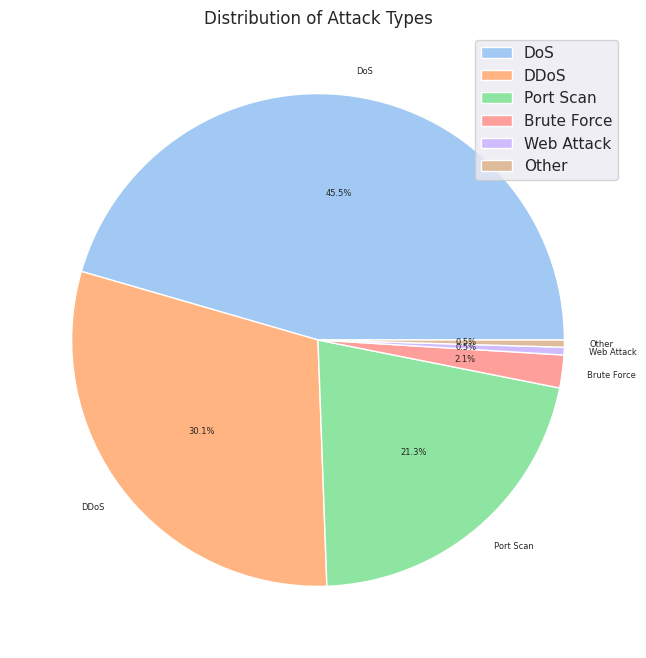

In [50]:
attack_counts = attacks['Attack Type'].value_counts()
threshold = 0.005
percentages = attack_counts / attack_counts.sum()
small_slices = percentages[percentages < threshold].index.tolist()
attack_counts['Other'] = attack_counts[small_slices].sum()
attack_counts.drop(small_slices, inplace = True)

sns.set_palette('pastel')
plt.figure(figsize = (8, 8))
plt.pie(attack_counts.values, labels = attack_counts.index, autopct = '%1.1f%%', textprops={'fontsize': 6})
plt.title('Distribution of Attack Types')
plt.legend(attack_counts.index, loc = 'best')
plt.show()

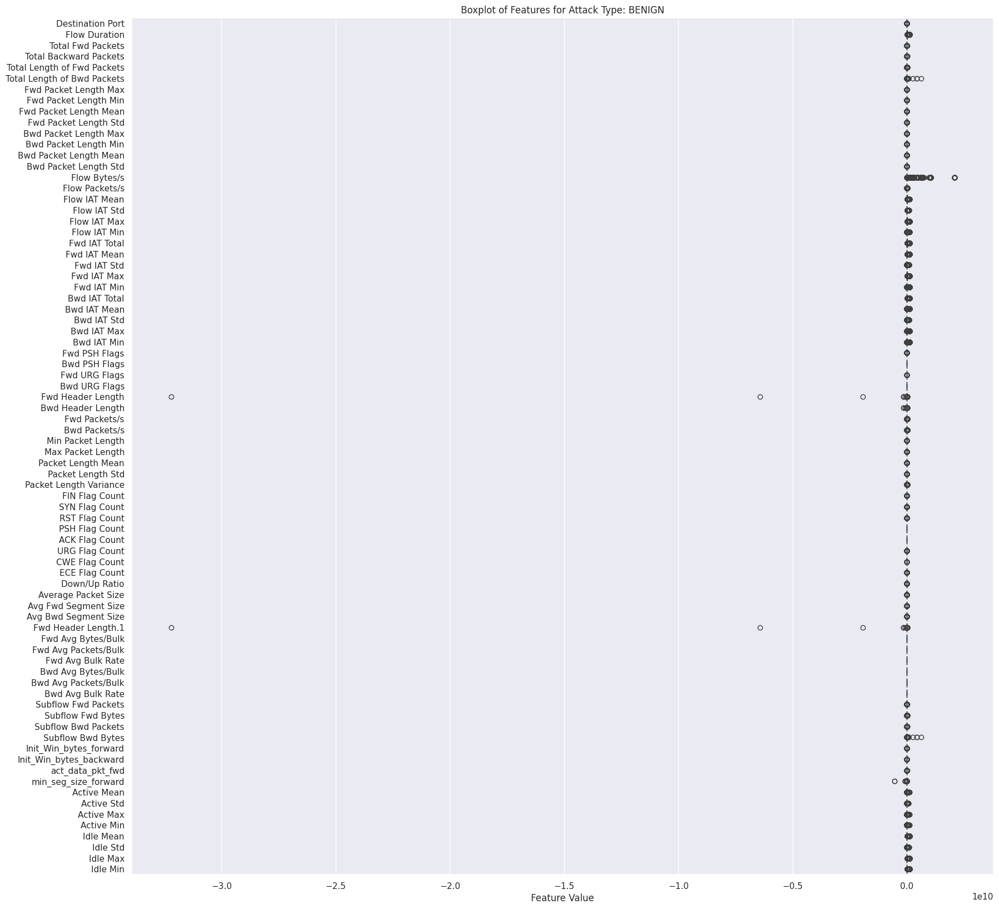

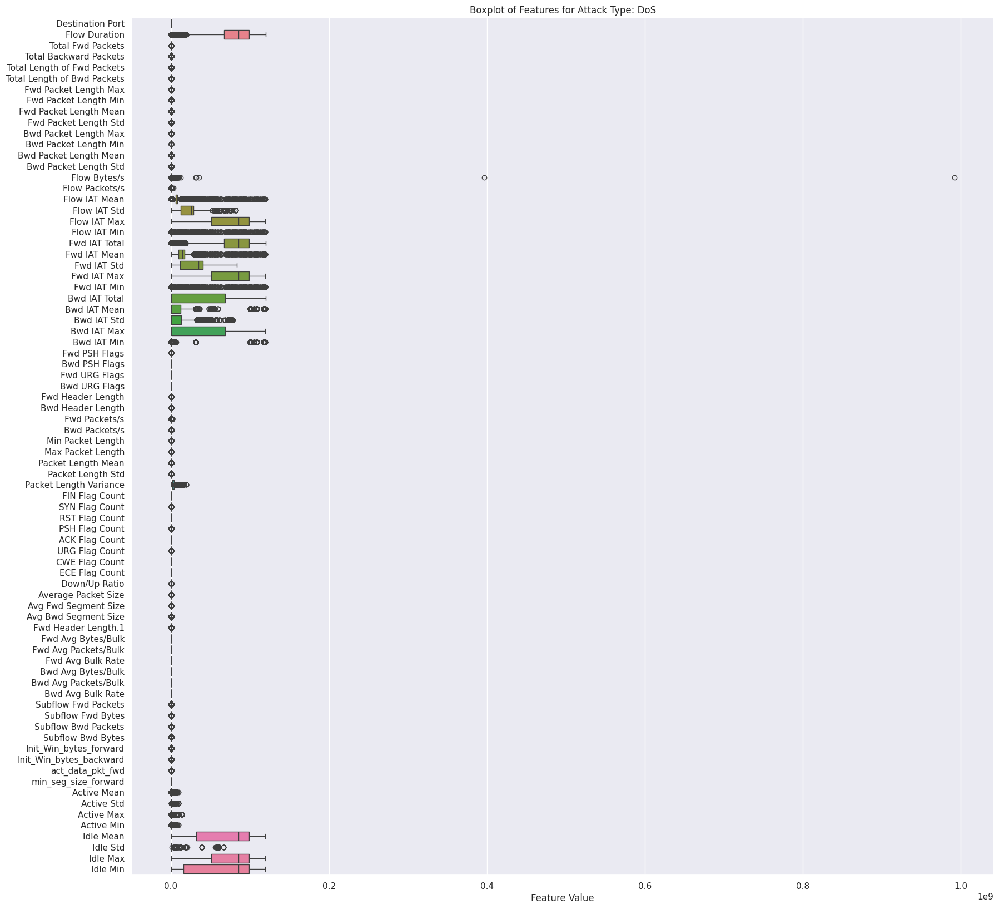

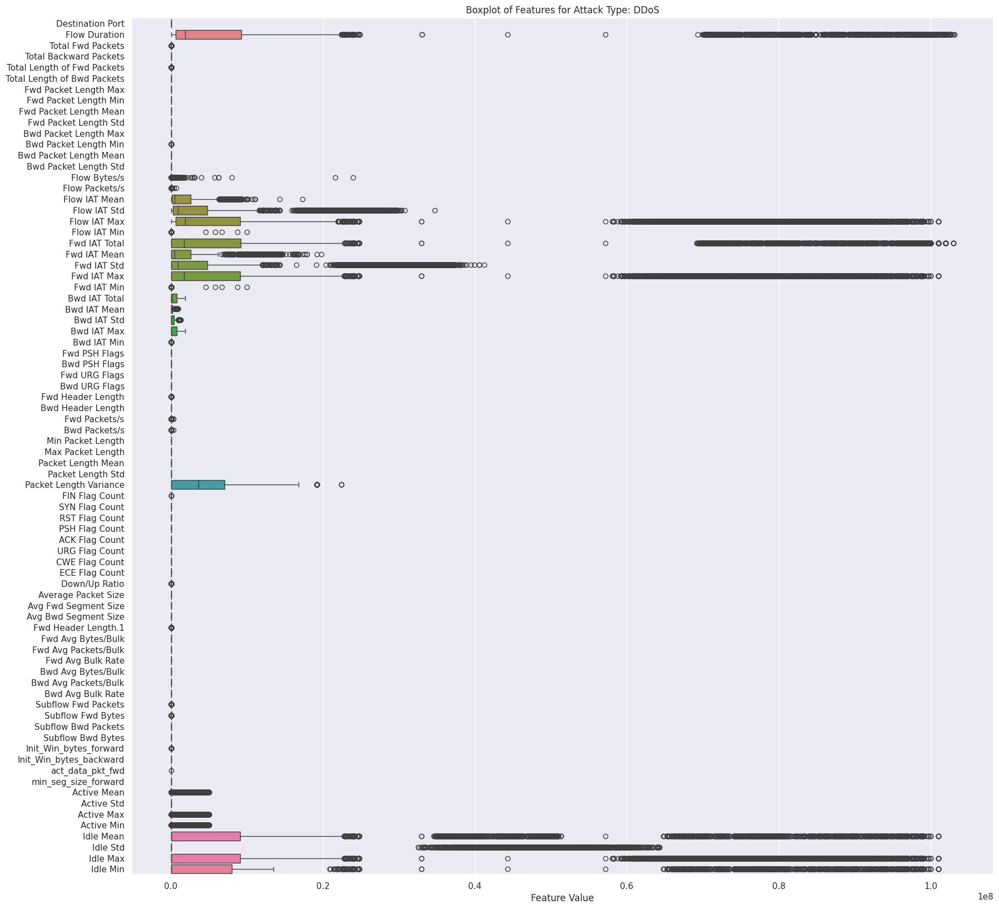

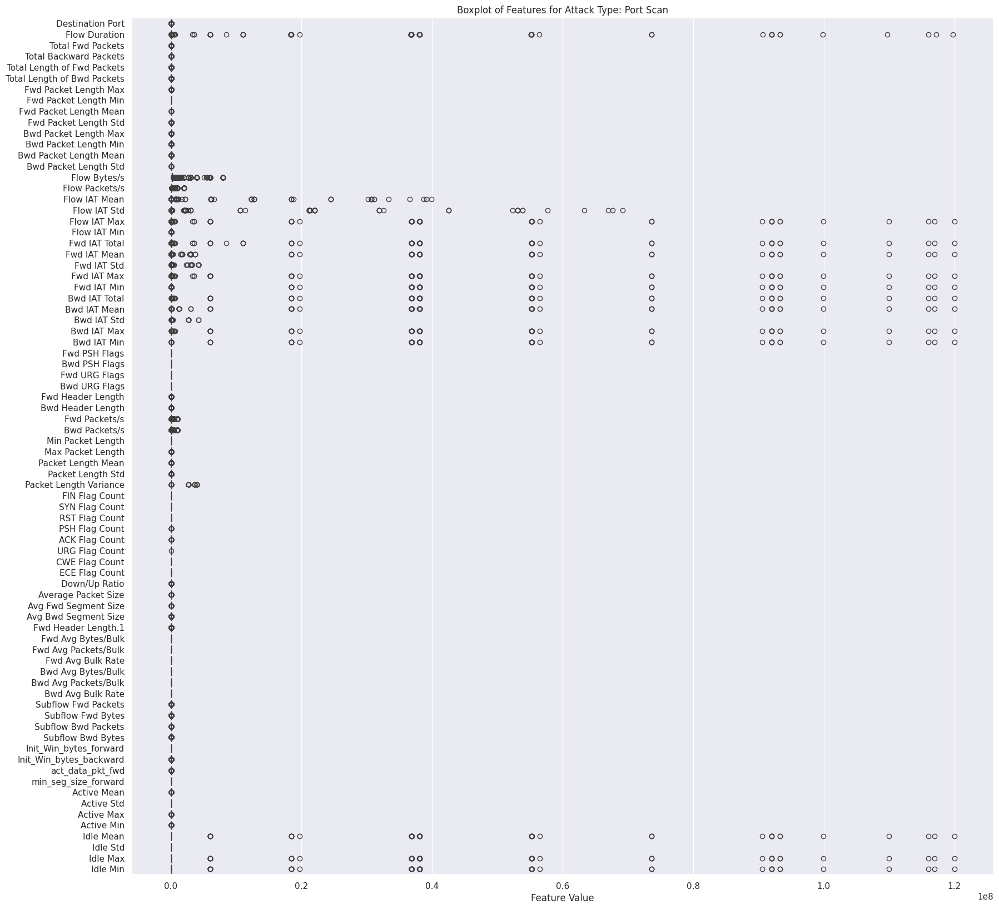

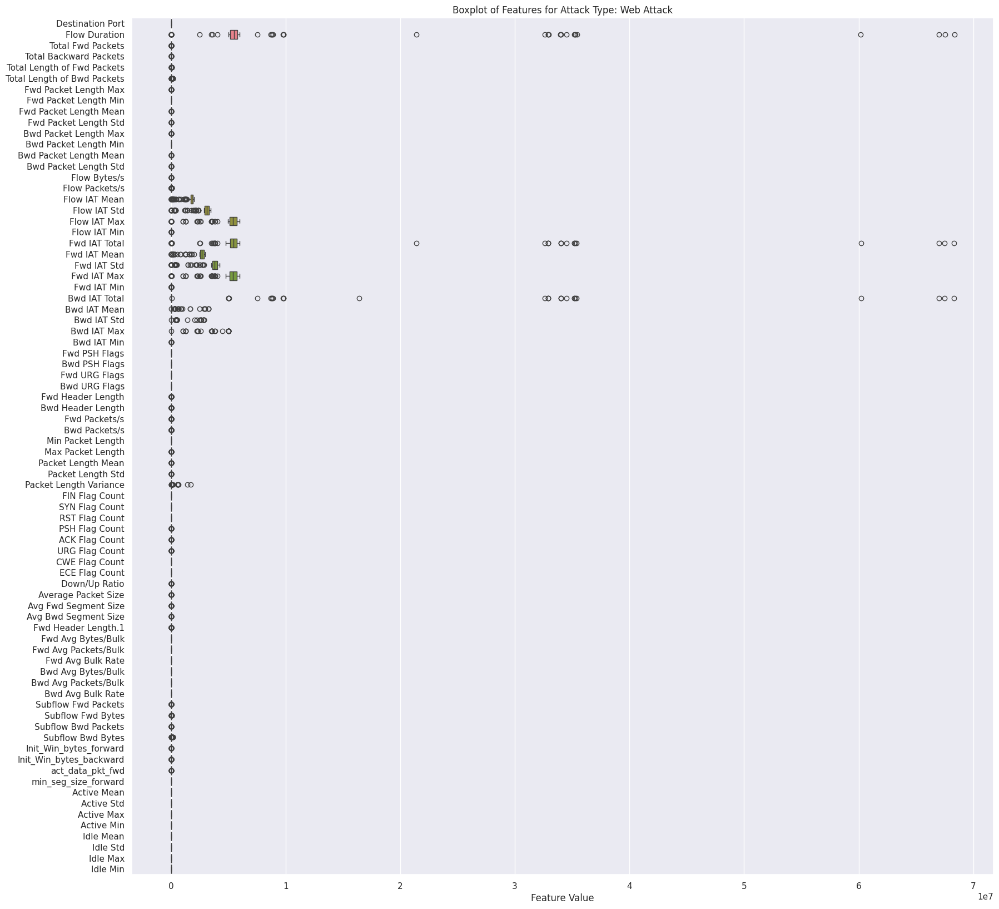

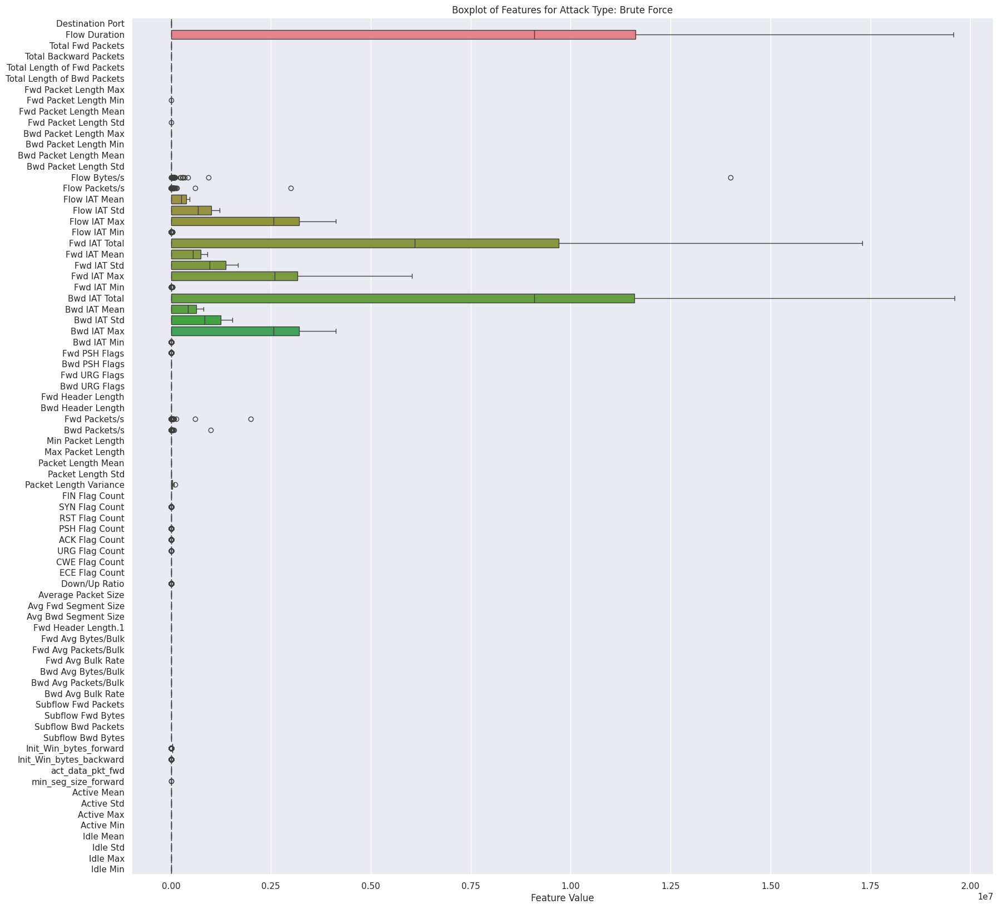

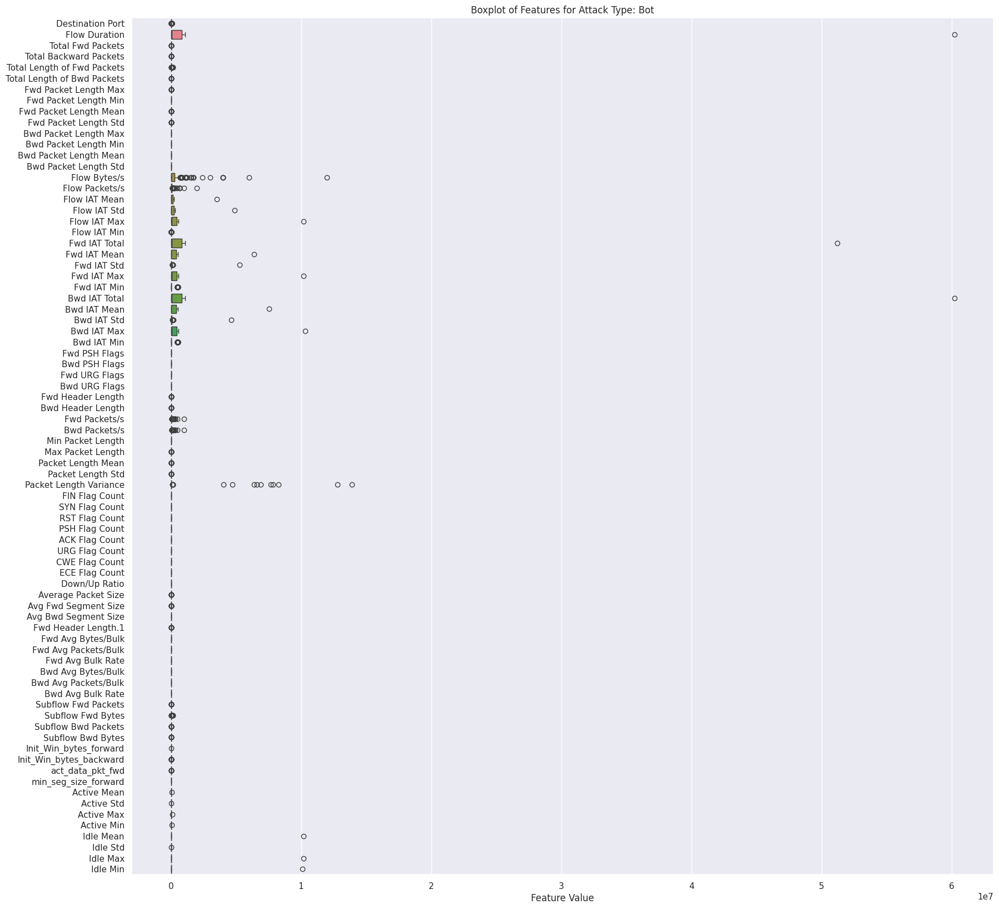

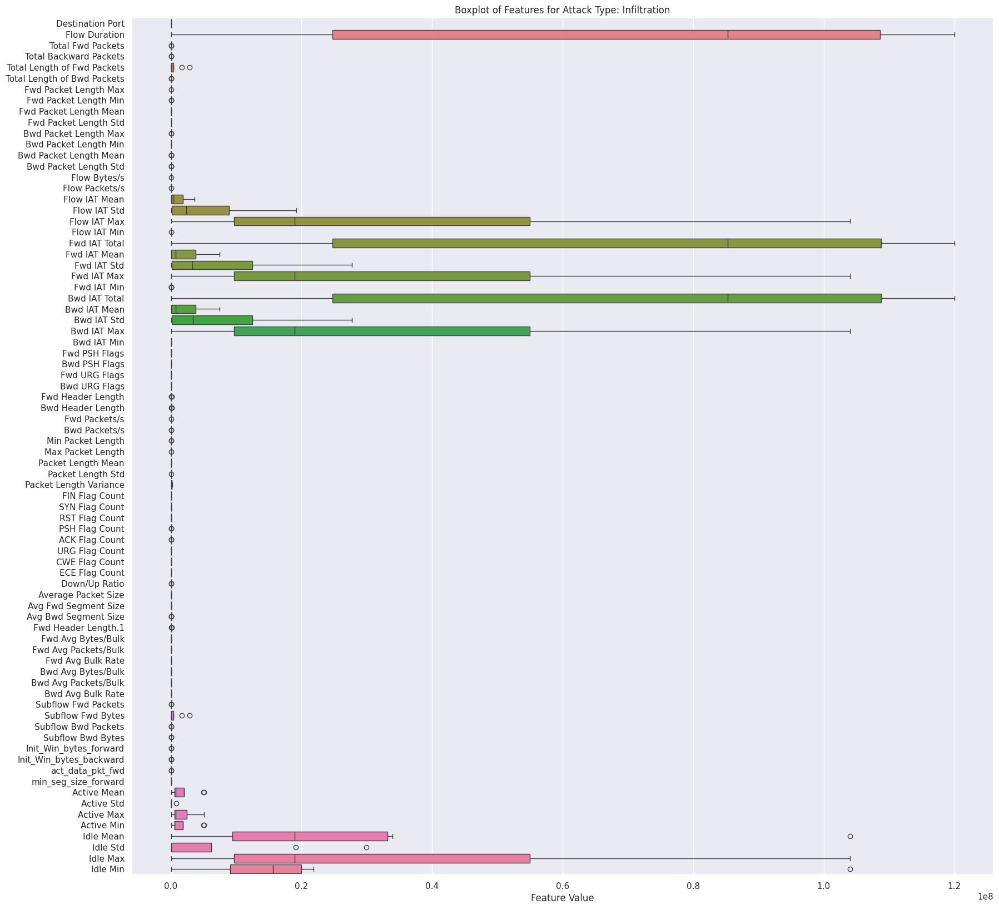

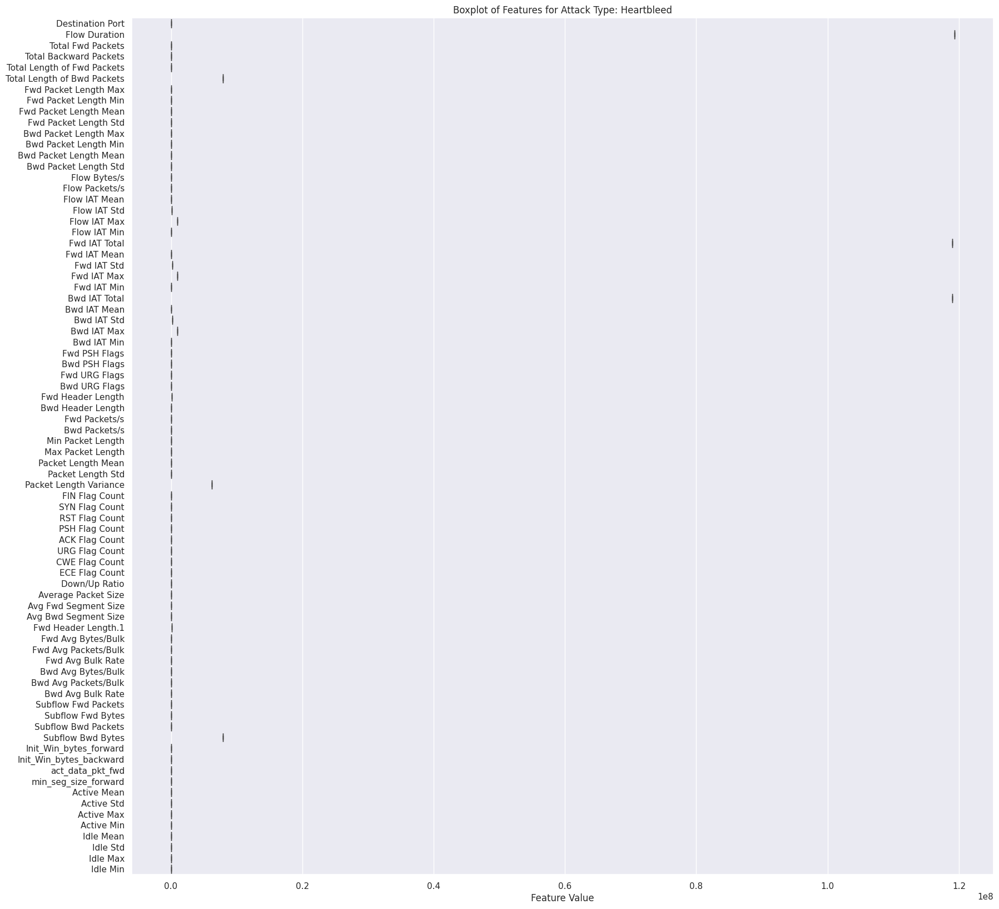

In [51]:
# Creating a boxplot for each attack type with the columns of sampled dataset
for attack_type in sampled_data['Attack Type'].unique():
    attack_data = sampled_data[sampled_data['Attack Type'] == attack_type]
    plt.figure(figsize=(20, 20))
    sns.boxplot(data = attack_data.drop(columns = ['Attack Type']), orient = 'h')
    plt.title(f'Boxplot of Features for Attack Type: {attack_type}')
    plt.xlabel('Feature Value')
    plt.show()

In [52]:
data.groupby('Attack Type').first()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
Attack Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BENIGN,49188,4,2,0,12,0,6,6,6.000000,0.000000,0,0,0.000000,0.000000,3.000000e+06,500000.000000,4.000000e+00,0.000000e+00,4,4,4,4.000000e+00,0.000000e+00,4,4,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,40,0,500000.000000,0.000000,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,0,9.000000,6.000000,0.000000,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.00000,0,0,0.0,0.00000,0,0
Bot,8080,60202640,9,9,322,256,322,0,35.777778,107.333333,256,0,28.444444,85.333333,9.600908e+00,0.298990,3.541332e+06,4.901981e+06,10200000,47,51200000,6.396442e+06,5.268490e+06,10200000,234,60200000,7.518954e+06,4.645137e+06,10300000,637,0,0,0,0,296,296,0.149495,0.149495,0,322,30.421053,91.783753,8.424257e+03,0,0,0,1,0,0,0,0,1,32.111111,35.777778,28.444444,296,0,0,0,0,0,0,9,322,9,256,29200,110,1,32,63678.2,22252.53596,103175,50911,10200000.0,34941.27201,10200000,10100000
Brute Force,80,5216127,3,1,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000e+00,0.766852,1.738709e+06,3.010454e+06,5214882,124,5216127,2.608064e+06,3.686598e+06,5214882,1245,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,104,40,0.575139,0.191713,0,0,0.000000,0.000000,0.000000e+00,0,0,0,1,0,0,0,0,0,0.000000,0.000000,0.000000,104,0,0,0,0,0,0,3,0,1,0,29200,28960,0,32,0.0,0.00000,0,0,0.0,0.00000,0,0
DDoS,80,1293792,3,7,26,11607,20,0,8.666667,10.263203,5840,0,1658.142857,2137.297080,8.991399e+03,7.729218,1.437547e+05,4.308658e+05,1292730,2,747,3.735000e+02,5.239661e+02,744,3,1293746,2.156243e+05,5.276719e+05,1292730,2,0,0,0,0,72,152,2.318765,5.410452,0,5840,1057.545455,1853.437529,3.435231e+06,0,0,0,1,0,0,0,0,2,1163.300000,8.666667,1658.142857,72,0,0,0,0,0,0,3,26,7,11607,8192,229,2,20,0.0,0.00000,0,0,0.0,0.00000,0,0
DoS,80,5169956,8,6,1101,4222,410,0,137.625000,185.758628,3525,0,703.666667,1395.868284,1.029603e+03,2.707953,3.976889e+05,1.368409e+06,4951173,112,218783,3.125471e+04,3.068629e+04,78311,219,5169833,1.033967e+06,2.218975e+06,5002421,840,0,0,0,0,172,132,1.547402,1.160551,0,3525,354.866667,895.115146,8.012311e+05,0,0,0,1,0,0,0,0,0,380.214286,137.625000,703.666667,172,0,0,0,0,0,0,8,1101,6,4222,8192,254,7,20,0.0,0.00000,0,0,0.0,0.00000,0,0
Heartbleed,444,119302728,2685,1729,8299,7556917,517,0,3.090875,16.858421,17376,0,4370.686524,2566.935004,6.341193e+04,36.998316,2.703438e+04,1.746258e+05,5024984,0,119000000,4.444951e+04,2.224617e+05,5025702,0,119000000,6.904091e+04,2.738674e+05,5024984,1,0,0,0,0,85928,55336,22.505772,14.492544,0,17376,1713.525708,2669.389319,7.125639e+06,0,0,0,1,0,0,0,0,0,1713.913910,3.090875,4370.686524,85928,0,0,0,0,0,0,2685,8299,1729,7556917,29200,235,118,32,2217.0,0.00000,2217,2217,5024984.0,0.00000

In [53]:
# For improving performance and reduce memory-related errors
old_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f'Initial memory usage: {old_memory_usage:.2f} MB')
for col in data.columns:
    col_type = data[col].dtype
    if col_type != object:
        c_min = data[col].min()
        c_max = data[col].max()
        # Downcasting float64 to float32
        if str(col_type).find('float') >= 0 and c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
            data[col] = data[col].astype(np.float32)

        # Downcasting int64 to int32
        elif str(col_type).find('int') >= 0 and c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
            data[col] = data[col].astype(np.int32)

new_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f"Final memory usage: {new_memory_usage:.2f} MB")

Initial memory usage: 1519.34 MB
Final memory usage: 788.52 MB


In [54]:
# Calculating percentage reduction in memory usage
print(f'Reduced memory usage: {1 - (new_memory_usage / old_memory_usage):.2%}')

Reduced memory usage: 48.10%


In [55]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2520798 entries, 0 to 2520797
Data columns (total 79 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Destination Port             int32  
 1   Flow Duration                int32  
 2   Total Fwd Packets            int32  
 3   Total Backward Packets       int32  
 4   Total Length of Fwd Packets  int32  
 5   Total Length of Bwd Packets  int32  
 6   Fwd Packet Length Max        int32  
 7   Fwd Packet Length Min        int32  
 8   Fwd Packet Length Mean       float32
 9   Fwd Packet Length Std        float32
 10  Bwd Packet Length Max        int32  
 11  Bwd Packet Length Min        int32  
 12  Bwd Packet Length Mean       float32
 13  Bwd Packet Length Std        float32
 14  Flow Bytes/s                 float32
 15  Flow Packets/s               float32
 16  Flow IAT Mean                float32
 17  Flow IAT Std                 float32
 18  Flow IAT Max                 int32  
 19  

In [56]:
# Dropping columns with only one unique value
num_unique = data.nunique()
one_variable = num_unique[num_unique == 1]
not_one_variable = num_unique[num_unique > 1].index

dropped_cols = one_variable.index
data = data[not_one_variable]

print('Dropped columns:')
dropped_cols

Dropped columns:


Index(['Bwd PSH Flags', 'Bwd URG Flags', 'Fwd Avg Bytes/Bulk',
       'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate', 'Bwd Avg Bytes/Bulk',
       'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate'],
      dtype='object')

In [57]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Destination Port,2520798.0,8.690590e+03,1.901280e+04,0.000000e+00,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,2520798.0,1.659161e+07,3.523276e+07,-1.300000e+01,208.000000,50622.000000,5.333340e+06,1.200000e+08
Total Fwd Packets,2520798.0,1.028174e+01,7.944201e+02,1.000000e+00,2.000000,2.000000,6.000000e+00,2.197590e+05
Total Backward Packets,2520798.0,1.157280e+01,1.056922e+03,0.000000e+00,1.000000,2.000000,5.000000e+00,2.919220e+05
Total Length of Fwd Packets,2520798.0,6.119477e+02,1.058827e+04,0.000000e+00,12.000000,66.000000,3.320000e+02,1.290000e+07
Total Length of Bwd Packets,2520798.0,1.814440e+04,2.398177e+06,0.000000e+00,6.000000,156.000000,9.970000e+02,6.554530e+08
Fwd Packet Length Max,2520798.0,2.312292e+02,7.563755e+02,0.000000e+00,6.000000,40.000000,2.020000e+02,2.482000e+04
Fwd Packet Length Min,2520798.0,1.920349e+01,6.079834e+01,0.000000e+00,0.000000,2.000000,3.700000e+01,2.325000e+03
Fwd Packet Length Mean,2520798.0,6.350494e+01,1.955526e+02,0.000000e+00,6.000000,36.250000,5.200000e+01,5.940857e+03
Fwd Packet Length Std,2520798.0,7.732349e+01,2.968814e+02,0.000000e+00,0.000000,0.000000,7.419280e+01,7.125597e+03


In [58]:
data.shape

(2520798, 71)

In [59]:
# Columns after removing non variant columns
data.columns

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Fwd URG Flags',
       'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s',
       'Bwd Packets/s', 'Min Packet Length', 'Max Packet Length',
       'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance',
       'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count',

In [60]:
# Standardizing the dataset
from sklearn.preprocessing import StandardScaler

features = data.drop('Attack Type', axis = 1)
attacks = data['Attack Type']

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

In [61]:
from sklearn.decomposition import IncrementalPCA

size = len(features.columns) // 2
ipca = IncrementalPCA(n_components = size, batch_size = 500)
for batch in np.array_split(scaled_features, len(features) // 500):
    ipca.partial_fit(batch)

print(f'information retained: {sum(ipca.explained_variance_ratio_):.2%}')

information retained: 99.30%


In [62]:
transformed_features = ipca.transform(scaled_features)
new_data = pd.DataFrame(transformed_features, columns = [f'PC{i+1}' for i in range(size)])
new_data['Attack Type'] = attacks.values

In [63]:
type(new_data)

pandas.core.frame.DataFrame

In [64]:
print(new_data.head())

        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -2.358011 -0.055017  0.577556  0.737266  3.731638  0.236191 -0.015691   
1 -2.884388 -0.069997  0.911770  1.768756  8.848829  0.625434 -0.056611   
2 -2.417348 -0.056721  0.615553  0.853998  4.305641  0.277703 -0.020408   
3 -2.885238 -0.070037  0.912633  1.770878  8.854255  0.623697 -0.056781   
4 -1.506064  0.080875 -0.504254  0.290077 -0.539338  0.746587  0.100634   

        PC8       PC9      PC10      PC11      PC12      PC13      PC14  \
0 -0.216607 -0.280678  1.090372  0.033119  0.067405  1.635054  0.371806   
1  1.099057  1.899467 -2.750866 -0.949644 -0.840047  6.037518  1.570056   
2 -0.072266 -0.038016  0.667545 -0.075704 -0.032899  2.127636  0.504863   
3  1.097213  1.899891 -2.746889 -0.949271 -0.839523  6.040937  1.569974   
4  0.733052 -1.145435 -0.562349 -0.043646 -0.207324 -0.434246  0.033045   

       PC15      PC16      PC17      PC18      PC19      PC20      PC21  \
0 -0.794799  0.003588  

In [ ]:
import pandas as pd

# Assuming your cleaned and standardized data is available in a DataFrame named 'new_data'

# Save the DataFrame to a CSV file
new_data.to_csv("standardized_data.csv", index=False)

print("Standardized data saved as 'standardized_data.csv'")


In [ ]:
import pandas as pd

# Load the dataset
data = pd.read_csv("standardized_data.csv")

# Split the dataset into 5 groups of features (ensure the last column is the target/label)
features = data.iloc[:, :-1]  # All columns except the last
labels = data.iloc[:, -1]  # Target column

# Number of clients
num_clients = 5

# Calculate columns per client
cols_per_client = features.shape[1] // num_clients

# Create subsets of features for each client (last column as labels must be appended to each)
clients_data = [
    pd.concat([features.iloc[:, i * cols_per_client:(i + 1) * cols_per_client], labels], axis=1)
    for i in range(num_clients)
]

# Save each client's data to a CSV file
for i, client_data in enumerate(clients_data, 1):
    client_data.to_csv(f"client_{i}_vertical_data.csv", index=False)
    print(f"Client {i} vertical data saved as 'client_{i}_vertical_data.csv'")


In [68]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    precision_score,
    recall_score,
    f1_score
)

# Load Client 1's data
client1_data = pd.read_csv("Sisira Vertical split/client_1_vertical_data.csv")

# Separate features and target
X = client1_data.iloc[:, :-1]  # All columns except the last (features)
y = client1_data.iloc[:, -1]   # Last column (target)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Random Forest Classifier
rf_model_1 = RandomForestClassifier(random_state=42)

# Train the model
rf_model_1.fit(X_train, y_train)

# Predict on test set
y_pred = rf_model_1.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average="weighted")
recall = recall_score(y_test, y_pred, average="weighted")
f1 = f1_score(y_test, y_pred, average="weighted")

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Extracting True Positives, False Positives, True Negatives, and False Negatives for each class
TP = conf_matrix.diagonal()  # True Positives per class
FP = conf_matrix.sum(axis=0) - conf_matrix.diagonal()  # False Positives per class
FN = conf_matrix.sum(axis=1) - conf_matrix.diagonal()  # False Negatives per class
TN = conf_matrix.sum() - (FP + FN + TP)  # True Negatives per class

# Print metrics
print("Confusion Matrix:\n", conf_matrix)
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

print("\nDetailed Classification Report:\n", classification_report(y_test, y_pred))

# Print detailed counts for each class
print("\nTrue Positives per class:", TP)
print("False Positives per class:", FP)
print("False Negatives per class:", FN)
print("True Negatives per class:", TN)

# Overall sums
print("\nTotal True Positives:", TP.sum())
print("Total False Positives:", FP.sum())
print("Total True Negatives:", TN.sum())
print("Total False Negatives:", FN.sum())


Confusion Matrix:
 [[418880     61      8      9     86      0      0    207      1]
 [   136    252      0      0      0      0      0      0      0]
 [    15      0   1871      0      0      0      0      1      1]
 [    24      0      0  25470      7      0      0      0      0]
 [   181      0      0      2  38332      0      0      1      1]
 [     0      0      0      0      0      2      0      0      0]
 [     7      0      0      0      0      0      2      0      0]
 [   159      0      0      0      5      0      0  18023      0]
 [    13      0      2      0      3      0      0      4    394]]
Accuracy: 99.81%
Precision: 1.00
Recall: 1.00
F1 Score: 1.00

Detailed Classification Report:
               precision    recall  f1-score   support

      BENIGN       1.00      1.00      1.00    419252
         Bot       0.81      0.65      0.72       388
 Brute Force       0.99      0.99      0.99      1888
        DDoS       1.00      1.00      1.00     25501
         DoS       1

In [69]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    precision_score,
    recall_score,
    f1_score
)

# Load Client 2's data
client2_data = pd.read_csv("Sisira Vertical split/client_2_vertical_data.csv")

# Separate features and target
X = client2_data.iloc[:, :-1]  # All columns except the last (features)
y = client2_data.iloc[:, -1]   # Last column (target)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Random Forest Classifier
rf_model_2 = RandomForestClassifier(random_state=42)

# Train the model
rf_model_2.fit(X_train, y_train)

# Predict on test set
y_pred = rf_model_2.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average="weighted")
recall = recall_score(y_test, y_pred, average="weighted")
f1 = f1_score(y_test, y_pred, average="weighted")

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Extracting True Positives, False Positives, True Negatives, and False Negatives for each class
TP = conf_matrix.diagonal()  # True Positives per class
FP = conf_matrix.sum(axis=0) - conf_matrix.diagonal()  # False Positives per class
FN = conf_matrix.sum(axis=1) - conf_matrix.diagonal()  # False Negatives per class
TN = conf_matrix.sum() - (FP + FN + TP)  # True Negatives per class

# Print metrics
print("Confusion Matrix:\n", conf_matrix)
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

print("\nDetailed Classification Report:\n", classification_report(y_test, y_pred))

# Print detailed counts for each class
print("\nTrue Positives per class:", TP)
print("False Positives per class:", FP)
print("False Negatives per class:", FN)
print("True Negatives per class:", TN)

# Overall sums
print("\nTotal True Positives:", TP.sum())
print("Total False Positives:", FP.sum())
print("Total True Negatives:", TN.sum())
print("Total False Negatives:", FN.sum())


Confusion Matrix:
 [[417972     44     13      9    125      0      0   1089      0]
 [   143    245      0      0      0      0      0      0      0]
 [    24      0   1858      0      1      0      0      1      4]
 [    29      0      0  25446     26      0      0      0      0]
 [   234      0      0      6  38274      0      0      2      1]
 [     0      0      0      0      0      2      0      0      0]
 [     8      0      0      0      0      0      1      0      0]
 [   925      0      0      0      6      0      0  17256      0]
 [    13      0      4      0      3      0      0      2    394]]
Accuracy: 99.46%
Precision: 0.99
Recall: 0.99
F1 Score: 0.99

Detailed Classification Report:
               precision    recall  f1-score   support

      BENIGN       1.00      1.00      1.00    419252
         Bot       0.85      0.63      0.72       388
 Brute Force       0.99      0.98      0.99      1888
        DDoS       1.00      1.00      1.00     25501
         DoS       1

In [70]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    precision_score,
    recall_score,
    f1_score
)

# Load Client 3's data
client3_data = pd.read_csv("Sisira Vertical split/client_3_vertical_data.csv")

# Separate features and target
X = client3_data.iloc[:, :-1]  # All columns except the last (features)
y = client3_data.iloc[:, -1]   # Last column (target)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Random Forest Classifier
rf_model_3 = RandomForestClassifier(random_state=42)

# Train the model
rf_model_3.fit(X_train, y_train)

# Predict on test set
y_pred = rf_model_3.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average="weighted")
recall = recall_score(y_test, y_pred, average="weighted")
f1 = f1_score(y_test, y_pred, average="weighted")

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Extracting True Positives, False Positives, True Negatives, and False Negatives
TP = conf_matrix.diagonal().sum()  # True Positives (Sum of diagonal values)
FP = conf_matrix.sum(axis=0) - conf_matrix.diagonal()  # False Positives
FN = conf_matrix.sum(axis=1) - conf_matrix.diagonal()  # False Negatives
TN = conf_matrix.sum() - (FP + FN + TP)  # True Negatives

# Print metrics
print("Confusion Matrix:\n", conf_matrix)
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

print("\nDetailed Classification Report:\n", classification_report(y_test, y_pred))

print("\nTrue Positives:", TP)
print("False Positives:", FP.sum())
print("True Negatives:", TN.sum())
print("False Negatives:", FN.sum())


Confusion Matrix:
 [[417736     45     15      8     95      0      0   1353      0]
 [   158    230      0      0      0      0      0      0      0]
 [    25      0   1860      0      0      0      0      0      3]
 [    37      0      0  25460      4      0      0      0      0]
 [   177      0      0      6  38330      0      0      3      1]
 [     1      0      0      0      0      1      0      0      0]
 [     8      0      0      0      0      0      1      0      0]
 [  1188      0      1      0      7      0      0  16991      0]
 [    13      0      3      0      4      0      0      2    394]]
Accuracy: 99.37%
Precision: 0.99
Recall: 0.99
F1 Score: 0.99

Detailed Classification Report:
               precision    recall  f1-score   support

      BENIGN       1.00      1.00      1.00    419252
         Bot       0.84      0.59      0.69       388
 Brute Force       0.99      0.99      0.99      1888
        DDoS       1.00      1.00      1.00     25501
         DoS       1

In [71]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    precision_score,
    recall_score,
    f1_score
)

# Load Client 4's data
client4_data = pd.read_csv("Sisira Vertical split/client_4_vertical_data.csv")

# Separate features and target
X = client4_data.iloc[:, :-1]  # All columns except the last (features)
y = client4_data.iloc[:, -1]   # Last column (target)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Random Forest Classifier
rf_model_4 = RandomForestClassifier(random_state=42)

# Train the model
rf_model_4.fit(X_train, y_train)

# Predict on test set
y_pred = rf_model_4.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average="weighted")
recall = recall_score(y_test, y_pred, average="weighted")
f1 = f1_score(y_test, y_pred, average="weighted")

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Extracting True Positives, False Positives, True Negatives, and False Negatives
TP = conf_matrix.diagonal().sum()  # True Positives (Sum of diagonal values)
FP = conf_matrix.sum(axis=0) - conf_matrix.diagonal()  # False Positives
FN = conf_matrix.sum(axis=1) - conf_matrix.diagonal()  # False Negatives
TN = conf_matrix.sum() - (FP + FN + TP)  # True Negatives

# Print metrics
print("Confusion Matrix:\n", conf_matrix)
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

print("\nDetailed Classification Report:\n", classification_report(y_test, y_pred))

print("\nTrue Positives:", TP)
print("False Positives:", FP.sum())
print("True Negatives:", TN.sum())
print("False Negatives:", FN.sum())


/jupyter/dtids.user01/.local/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Confusion Matrix:
 [[417598     58     16      7    101      0      0   1471      1]
 [   137    251      0      0      0      0      0      0      0]
 [    16      0   1871      0      1      0      0      0      0]
 [    29      0      0  25464      8      0      0      0      0]
 [   170      0      0      2  38343      0      0      1      1]
 [     0      0      0      0      0      2      0      0      0]
 [     9      0      0      0      0      0      0      0      0]
 [  1299      0      0      0      7      0      0  16881      0]
 [    18      0      1      0      0      0      0      4    393]]
Accuracy: 99.33%
Precision: 0.99
Recall: 0.99
F1 Score: 0.99


/jupyter/dtids.user01/.local/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/jupyter/dtids.user01/.local/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Detailed Classification Report:
               precision    recall  f1-score   support

      BENIGN       1.00      1.00      1.00    419252
         Bot       0.81      0.65      0.72       388
 Brute Force       0.99      0.99      0.99      1888
        DDoS       1.00      1.00      1.00     25501
         DoS       1.00      1.00      1.00     38517
  Heartbleed       1.00      1.00      1.00         2
Infiltration       0.00      0.00      0.00         9
   Port Scan       0.92      0.93      0.92     18187
  Web Attack       0.99      0.94      0.97       416

    accuracy                           0.99    504160
   macro avg       0.86      0.83      0.84    504160
weighted avg       0.99      0.99      0.99    504160


True Positives: 500803
False Positives: 3357
True Negatives: 23499
False Negatives: 3357


/jupyter/dtids.user01/.local/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [72]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    precision_score,
    recall_score,
    f1_score
)

# Load Client 5's data
client5_data = pd.read_csv("Sisira Vertical split/client_5_vertical_data.csv")

# Separate features and target
X = client5_data.iloc[:, :-1]  # All columns except the last (features)
y = client5_data.iloc[:, -1]   # Last column (target)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Random Forest Classifier
rf_model_5 = RandomForestClassifier(random_state=42)

# Train the model
rf_model_5.fit(X_train, y_train)

# Predict on test set
y_pred = rf_model_5.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average="weighted")
recall = recall_score(y_test, y_pred, average="weighted")
f1 = f1_score(y_test, y_pred, average="weighted")

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Extracting True Positives, False Positives, True Negatives, and False Negatives
TP = conf_matrix.diagonal().sum()  # True Positives (Sum of diagonal values)
FP = conf_matrix.sum(axis=0) - conf_matrix.diagonal()  # False Positives
FN = conf_matrix.sum(axis=1) - conf_matrix.diagonal()  # False Negatives
TN = conf_matrix.sum() - (FP + FN + TP)  # True Negatives

# Print metrics
print("Confusion Matrix:\n", conf_matrix)
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

print("\nDetailed Classification Report:\n", classification_report(y_test, y_pred))

print("\nTrue Positives:", TP)
print("False Positives:", FP.sum())
print("True Negatives:", TN.sum())
print("False Negatives:", FN.sum())


Confusion Matrix:
 [[418813     48      7     30    100      0      0    253      1]
 [   137    251      0      0      0      0      0      0      0]
 [    13      0   1875      0      0      0      0      0      0]
 [    80      0      0  25397     24      0      0      0      0]
 [   404      0      0      5  38106      0      0      1      1]
 [     1      0      0      0      0      1      0      0      0]
 [     8      0      0      0      0      0      1      0      0]
 [   194      0      0      0      7      0      0  17986      0]
 [    15      0      3      0      2      0      0      3    393]]
Accuracy: 99.73%
Precision: 1.00
Recall: 1.00
F1 Score: 1.00

Detailed Classification Report:
               precision    recall  f1-score   support

      BENIGN       1.00      1.00      1.00    419252
         Bot       0.84      0.65      0.73       388
 Brute Force       0.99      0.99      0.99      1888
        DDoS       1.00      1.00      1.00     25501
         DoS       1

In [79]:
import joblib

# Save the trained Random Forest models for each client
joblib.dump(rf_model_1, 'Sisira Vertical split/client_1_rf_model.pkl')
print("Client 1 model saved as 'client_1_rf_model.pkl'")

joblib.dump(rf_model_2, 'Sisira Vertical split/client_2_rf_model.pkl')
print("Client 2 model saved as 'client_2_rf_model.pkl'")

joblib.dump(rf_model_3, 'Sisira Vertical split/client_3_rf_model.pkl')
print("Client 3 model saved as 'client_3_rf_model.pkl'")

joblib.dump(rf_model_4, 'Sisira Vertical split/client_4_rf_model.pkl')
print("Client 4 model saved as 'client_4_rf_model.pkl'")

joblib.dump(rf_model_5, 'Sisira Vertical split/client_5_rf_model.pkl')
print("Client 5 model saved as 'client_5_rf_model.pkl'")


Client 1 model saved as 'client_1_rf_model.pkl'
Client 2 model saved as 'client_2_rf_model.pkl'
Client 3 model saved as 'client_3_rf_model.pkl'
Client 4 model saved as 'client_4_rf_model.pkl'
Client 5 model saved as 'client_5_rf_model.pkl'


In [80]:
import joblib

# Load the saved Random Forest models for each client
rf_model_1_loaded = joblib.load('Sisira Vertical split/client_1_rf_model.pkl')
print("Client 1 model loaded successfully.")

rf_model_2_loaded = joblib.load('Sisira Vertical split/client_2_rf_model.pkl')
print("Client 2 model loaded successfully.")

rf_model_3_loaded = joblib.load('Sisira Vertical split/client_3_rf_model.pkl')
print("Client 3 model loaded successfully.")

rf_model_4_loaded = joblib.load('Sisira Vertical split/client_4_rf_model.pkl')
print("Client 4 model loaded successfully.")

rf_model_5_loaded = joblib.load('Sisira Vertical split/client_5_rf_model.pkl')
print("Client 5 model loaded successfully.")


Client 1 model loaded successfully.
Client 2 model loaded successfully.
Client 3 model loaded successfully.
Client 4 model loaded successfully.
Client 5 model loaded successfully.


In [81]:
import joblib
import os

# Define paths for the saved models
model_paths = {
    "Client 1": "Sisira Vertical split/client_1_rf_model.pkl",
    "Client 2": "Sisira Vertical split/client_2_rf_model.pkl",
    "Client 3": "Sisira Vertical split/client_3_rf_model.pkl",
    "Client 4": "Sisira Vertical split/client_4_rf_model.pkl",
    "Client 5": "Sisira Vertical split/client_5_rf_model.pkl",
}

# Dictionary to store loaded models
loaded_models = {}

# Load all models
for client, path in model_paths.items():
    if os.path.exists(path):
        loaded_models[client] = joblib.load(path)
        print(f"{client} model loaded successfully from {path}")
    else:
        print(f"Error: {client} model file not found at {path}")

# Verify the loaded models (optional)
for client, model in loaded_models.items():
    print(f"{client}: {type(model)}")


Client 1 model loaded successfully from Sisira Vertical split/client_1_rf_model.pkl
Client 2 model loaded successfully from Sisira Vertical split/client_2_rf_model.pkl
Client 3 model loaded successfully from Sisira Vertical split/client_3_rf_model.pkl
Client 4 model loaded successfully from Sisira Vertical split/client_4_rf_model.pkl
Client 5 model loaded successfully from Sisira Vertical split/client_5_rf_model.pkl
Client 1: <class 'sklearn.ensemble._forest.RandomForestClassifier'>
Client 2: <class 'sklearn.ensemble._forest.RandomForestClassifier'>
Client 3: <class 'sklearn.ensemble._forest.RandomForestClassifier'>
Client 4: <class 'sklearn.ensemble._forest.RandomForestClassifier'>
Client 5: <class 'sklearn.ensemble._forest.RandomForestClassifier'>


In [82]:
import requests
import os

# Define the server URL
server_url = "http://127.0.0.1:5000/upload"  # Replace with your server's IP and port

# Paths to the saved models for each client
model_paths = {
    "Client 1": "Sisira Vertical split/client_1_rf_model.pkl",
    "Client 2": "Sisira Vertical split/client_2_rf_model.pkl",
    "Client 3": "Sisira Vertical split/client_3_rf_model.pkl",
    "Client 4": "Sisira Vertical split/client_4_rf_model.pkl",
    "Client 5": "Sisira Vertical split/client_5_rf_model.pkl",
}

# Send model updates to the central server
for client, path in model_paths.items():
    if os.path.exists(path):
        with open(path, "rb") as f:
            response = requests.post(server_url, files={"file": f}, data={"client": client})
            if response.status_code == 200:
                print(f"{client} model updates successfully sent to the server.")
            else:
                print(f"Failed to send {client} updates. Server response: {response.status_code}")
    else:
        print(f"Error: {client} model file not found at {path}")



ConnectionError: HTTPConnectionPool(host='127.0.0.1', port=5000): Max retries exceeded with url: /upload (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7ffe6821b610>: Failed to establish a new connection: [Errno 111] Connection refused'))

In [83]:
python server.py



SyntaxError: invalid syntax (1107776004.py, line 1)

In [84]:
import joblib
import numpy as np

# Function to extract model updates from a trained model
def extract_model_update(client_id):
    # Load the trained model from the file
    model = joblib.load(f'client_{client_id}_rf_model.pkl')
    
    # Extract relevant parameters
    n_estimators = model.n_estimators  # Number of trees in the forest
    max_depth = model.max_depth  # Maximum depth of trees
    trees = model.estimators_  # List of decision trees in the forest
    
    # Create a model update dictionary
    model_update = {
        'n_estimators': n_estimators,
        'max_depth': max_depth,
        'trees': trees  # List of trees for the model
    }
    
    return model_update

# Collecting model updates for all 5 clients
model_updates = []

for client_id in range(1, 6):  # Iterate through clients 1 to 5
    try:
        # Extract the model update from each client
        model_update = extract_model_update(client_id)
        model_updates.append(model_update)
        print(f"Loaded model update from client_{client_id}")
    except FileNotFoundError:
        print(f"Model update from client_{client_id} not found!")
    
# Now, model_updates contains the list of updates from all clients


Model update from client_1 not found!
Model update from client_2 not found!
Model update from client_3 not found!
Model update from client_4 not found!
Model update from client_5 not found!


In [85]:
import joblib
import os

# Function to extract model updates from a trained model
def extract_model_update(client_id):
    model_path = f'Sisira Vertical split/client_{client_id}_rf_model.pkl'  # Full path to the model
    if os.path.exists(model_path):
        # Load the trained model from the file
        model = joblib.load(model_path)
        
        # Extract relevant parameters
        n_estimators = model.n_estimators  # Number of trees in the forest
        max_depth = model.max_depth  # Maximum depth of trees
        trees = model.estimators_  # List of decision trees in the forest

        # Create a model update dictionary
        model_update = {
            'n_estimators': n_estimators,
            'max_depth': max_depth,
            'trees': trees  # List of trees for the model
        }

        return model_update
    else:
        print(f"Model file for client_{client_id} not found at {model_path}")
        return None

# Collecting model updates for all 5 clients
model_updates = []

for client_id in range(1, 6):  # Iterate through clients 1 to 5
    model_update = extract_model_update(client_id)
    if model_update:
        model_updates.append(model_update)
        print(f"Loaded model update from client_{client_id}")
    else:
        print(f"Model update from client_{client_id} not found!")

# Now, model_updates contains the list of updates from all clients
print("All model updates collected:", model_updates)


Loaded model update from client_1
Loaded model update from client_2
Loaded model update from client_3
Loaded model update from client_4
Loaded model update from client_5
All model updates collected: [{'n_estimators': 100, 'max_depth': None, 'trees': [DecisionTreeClassifier(max_features='sqrt', random_state=1608637542), DecisionTreeClassifier(max_features='sqrt', random_state=1273642419), DecisionTreeClassifier(max_features='sqrt', random_state=1935803228), DecisionTreeClassifier(max_features='sqrt', random_state=787846414), DecisionTreeClassifier(max_features='sqrt', random_state=996406378), DecisionTreeClassifier(max_features='sqrt', random_state=1201263687), DecisionTreeClassifier(max_features='sqrt', random_state=423734972), DecisionTreeClassifier(max_features='sqrt', random_state=415968276), DecisionTreeClassifier(max_features='sqrt', random_state=670094950), DecisionTreeClassifier(max_features='sqrt', random_state=1914837113), DecisionTreeClassifier(max_features='sqrt', random_sta

In [86]:
import requests
import joblib

# Function to send local model updates to the central server
def send_model_to_server(model_file, server_url):
    with open(model_file, 'rb') as model:
        files = {'model': ('model.pkl', model)}
        response = requests.post(server_url, files=files)
        if response.status_code == 200:
            print(f"Model from {model_file} sent successfully to the server!")
        else:
            print(f"Failed to send model from {model_file} to the server.")

# Example: Send model updates from multiple clients
clients = ['client_1_rf_model.pkl', 'client_2_rf_model.pkl', 'client_3_rf_model.pkl', 'client_4_rf_model.pkl', 'client_5_rf_model.pkl']

# URL of the central server's endpoint that receives model updates
server_url = 'http://central_server.com/upload_model'  # Replace with actual server URL

for client_model in clients:
    send_model_to_server(client_model, server_url)


FileNotFoundError: [Errno 2] No such file or directory: 'client_1_rf_model.pkl'

In [87]:
import numpy as np

# Extract all the trees from the updates
all_trees = [update['trees'] for update in model_updates]

# Transpose the list so we can work with trees in the same index across clients
# For example, trees[0] will contain all the trees at index 0 across clients
aggregated_trees = []

# Assuming all clients have the same number of trees
n_trees = len(all_trees[0])

for tree_index in range(n_trees):  # Loop through each tree index
    # Aggregate the trees from each client for the given tree index
    tree_aggregated = np.mean([tree[tree_index] for tree in all_trees], axis=0)
    aggregated_trees.append(tree_aggregated)

# Now aggregated_trees contains the averaged trees


TypeError: unsupported operand type(s) for +: 'DecisionTreeClassifier' and 'DecisionTreeClassifier'

In [88]:
from sklearn.ensemble import RandomForestClassifier
import numpy as np

# Sample test data (replace with your actual test data)
test_data = np.array([[1, 2, 3], [4, 5, 6]])  # Replace with real test data

# List to hold predictions from each model
all_predictions = []

# Generate predictions from each client model
for client_id in range(1, 6):  # Assume 5 clients
    model_update = extract_model_update(client_id)
    if model_update:
        model = RandomForestClassifier(n_estimators=model_update['n_estimators'], max_depth=model_update['max_depth'])
        model.estimators_ = model_update['trees']
        
        # Get the predictions from the local model
        predictions = model.predict(test_data)
        all_predictions.append(predictions)

# Convert list of predictions to a numpy array for easier manipulation
all_predictions = np.array(all_predictions)

# Aggregate predictions using majority voting (for classification)
aggregated_predictions = np.apply_along_axis(lambda x: np.bincount(x).argmax(), axis=0, arr=all_predictions)

print("Aggregated Predictions:", aggregated_predictions)


AttributeError: 'RandomForestClassifier' object has no attribute 'n_classes_'

In [89]:
from sklearn.ensemble import RandomForestClassifier
import numpy as np

# Sample test data (replace with your actual test data)
test_data = np.array([[1, 2, 3], [4, 5, 6]])  # Replace with real test data

# List to hold predictions from each model
all_predictions = []

# Generate predictions from each client model
for client_id in range(1, 6):  # Assume 5 clients
    model_update = extract_model_update(client_id)
    if model_update:
        # Create an instance of the model
        model = RandomForestClassifier(n_estimators=model_update['n_estimators'], max_depth=model_update['max_depth'])
        
        # Set the model's trees manually
        model.estimators_ = model_update['trees']
        
        # Manually set the classes_ attribute (if not available)
        all_classes = np.unique(np.concatenate([tree.classes_ for tree in model.estimators_]))
        model.classes_ = all_classes
        model.n_classes_ = len(all_classes)

        # Get the predictions from the local model
        predictions = model.predict(test_data)
        all_predictions.append(predictions)

# Convert list of predictions to a numpy array for easier manipulation
all_predictions = np.array(all_predictions)

# Aggregate predictions using majority voting (for classification)
aggregated_predictions = np.apply_along_axis(lambda x: np.bincount(x).argmax(), axis=0, arr=all_predictions)

print("Aggregated Predictions:", aggregated_predictions)


ValueError: X has 3 features, but DecisionTreeClassifier is expecting 7 features as input.

In [90]:
import pickle
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Load the trained models from the .pkl files
model_files = ["client_1_rf_model.pkl", "client_2_rf_model.pkl", "client_3_rf_model.pkl", "client_4_rf_model.pkl", "client_5_rf_model.pkl"]
client_models = []

for file in model_files:
    with open(file, 'rb') as f:
        model = pickle.load(f)
        client_models.append(model)

# Assume test_data and test_labels are available
# test_data = ...
# test_labels = ...

# Aggregating Random Forest models - Here we take the trees from each model and combine them
def federated_averaging_rf(models):
    # Extract the trees from each model
    all_trees = []
    for model in models:
        all_trees.extend(model.estimators_)  # Collect all decision trees from each client model

    # Create a new RandomForestClassifier model that will act as the global model
    # The number of trees in the global model is the sum of all trees from each client
    global_model = RandomForestClassifier(n_estimators=len(all_trees))

    # Set the decision trees of the global model to the aggregated trees
    global_model.estimators_ = all_trees  # Set the global model's trees to be the aggregated trees

    return global_model

# Create the global model by aggregating all the client models
global_model = federated_averaging_rf(client_models)

# Evaluate the global model on the test set (optional)
# predictions = global_model.predict(test_data)
# accuracy = accuracy_score(test_labels, predictions)
# print(f"Global model accuracy: {accuracy * 100:.2f}%")

# Save the aggregated global model to a file
with open("global_model.pkl", 'wb') as f:
    pickle.dump(global_model, f)

print("Federated model aggregation complete. Global model saved to 'global_model.pkl'")


FileNotFoundError: [Errno 2] No such file or directory: 'client_1_rf_model.pkl'

In [91]:
with open('path/to/client_1_rf_model.pkl', 'rb') as f:
    model = pickle.load(f)


FileNotFoundError: [Errno 2] No such file or directory: 'path/to/client_1_rf_model.pkl'

In [92]:
import joblib

# Save the model after training
joblib.dump(rf_model_1, 'client_1_model.pkl')



['client_1_model.pkl']

In [93]:
import joblib

# Save the model after training
joblib.dump(rf_model_1, 'client_2_model.pkl')


['client_2_model.pkl']

In [95]:
import joblib

# Save the model after training
joblib.dump(rf_model_1, 'client_3_model.pkl')


['client_3_model.pkl']

In [96]:
import joblib

# Save the model after training
joblib.dump(rf_model_1, 'client_4_model.pkl')


['client_4_model.pkl']

In [97]:
import joblib

# Save the model after training
joblib.dump(rf_model_1, 'client_5_model.pkl')


['client_5_model.pkl']

In [98]:
import joblib

# Load models from each client
model_1 = joblib.load('client_1_model.pkl')
model_2 = joblib.load('client_2_model.pkl')
model_3 = joblib.load('client_3_model.pkl')
model_4 = joblib.load('client_4_model.pkl')
model_5 = joblib.load('client_5_model.pkl')

# You can now perform federated aggregation here


In [ ]:
import joblib
import os

# Function to extract model updates from a trained model
def extract_model_update(client_id):
    model_path = f'Sisira Vertical split/client_{client_id}_rf_model.pkl'  # Full path to the model
    if os.path.exists(model_path):
        # Load the trained model from the file
        model = joblib.load(model_path)
        
        # Extract relevant parameters
        n_estimators = model.n_estimators  # Number of trees in the forest
        max_depth = model.max_depth  # Maximum depth of trees
        trees = model.estimators_  # List of decision trees in the forest

        # Create a model update dictionary
        model_update = {
            'n_estimators': n_estimators,
            'max_depth': max_depth,
            'trees': trees  # List of trees for the model
        }

        return model_update
    else:
        print(f"Model file for client_{client_id} not found at {model_path}")
        return None

# Collecting model updates for all 5 clients
model_updates = []

for client_id in range(1, 6):  # Iterate through clients 1 to 5
    model_update = extract_model_update(client_id)
    if model_update:
        model_updates.append(model_update)
        print(f"Loaded model update from client_{client_id}")
    else:
        print(f"Model update from client_{client_id} not found!")

# Now, model_updates contains the list of updates from all clients
print("All model updates collected:", model_updates)


In [99]:
import joblib
import os

# Function to extract model updates from a trained model
def extract_model_update(client_id):
    model_path = f'Sisira Vertical split/client_{client_id}_rf_model.pkl'  # Full path to the model
    if os.path.exists(model_path):
        try:
            # Load the trained model from the file
            model = joblib.load(model_path)

            # Extract relevant parameters
            if hasattr(model, 'n_estimators') and hasattr(model, 'max_depth') and hasattr(model, 'estimators_'):
                n_estimators = model.n_estimators  # Number of trees in the forest
                max_depth = model.max_depth  # Maximum depth of trees
                trees = model.estimators_  # List of decision trees in the forest

                # Create a model update dictionary
                model_update = {
                    'client_id': client_id,
                    'n_estimators': n_estimators,
                    'max_depth': max_depth,
                    'trees': trees  # List of trees for the model
                }
                return model_update
            else:
                print(f"Model from client_{client_id} does not have the expected attributes.")
                return None
        except Exception as e:
            print(f"Error loading or processing model for client_{client_id}: {e}")
            return None
    else:
        print(f"Model file for client_{client_id} not found at {model_path}")
        return None

# Collecting model updates for all clients
model_updates = []

for client_id in range(1, 6):  # Iterate through clients 1 to 5
    model_update = extract_model_update(client_id)
    if model_update:
        model_updates.append(model_update)
        print(f"Loaded model update from client_{client_id}")
    else:
        print(f"Model update from client_{client_id} not found or an error occurred!")

# Now, model_updates contains the list of updates from all clients
print("All model updates collected:")
for update in model_updates:
    print(update)


Model file for client_1 not found at Sisira Vertical split/client_1_rf_model.pkl
Model update from client_1 not found or an error occurred!
Model file for client_2 not found at Sisira Vertical split/client_2_rf_model.pkl
Model update from client_2 not found or an error occurred!
Model file for client_3 not found at Sisira Vertical split/client_3_rf_model.pkl
Model update from client_3 not found or an error occurred!
Model file for client_4 not found at Sisira Vertical split/client_4_rf_model.pkl
Model update from client_4 not found or an error occurred!
Model file for client_5 not found at Sisira Vertical split/client_5_rf_model.pkl
Model update from client_5 not found or an error occurred!
All model updates collected:


In [101]:
import os
print("Current working directory:", os.getcwd())


Current working directory: /jupyter/dtids.user01


In [102]:
import os
print("Current working directory:", os.getcwd())

Current working directory: /jupyter/dtids.user01


In [103]:
import os

# Check if the directory exists
directory = 'Sisira Vertical split'
if os.path.exists(directory):
    print(f"Directory {directory} exists.")
else:
    print(f"Directory {directory} does not exist. Please check the path.")


Directory Sisira Vertical split exists.


In [104]:
import os

directory = 'Sisira Vertical split'

# List all files in the directory to see if the model files are present
files_in_directory = os.listdir(directory)
print(f"Files in {directory}: {files_in_directory}")


Files in Sisira Vertical split: ['Copy2.ipynb', '.ipynb_checkpoints', 'Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv', 'Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv', 'Friday-WorkingHours-Morning.pcap_ISCX.csv', 'Monday-WorkingHours.pcap_ISCX.csv', 'Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv', 'Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv', 'Tuesday-WorkingHours.pcap_ISCX.csv', 'Wednesday-workingHours.pcap_ISCX.csv', 'standardized_data.csv', 'client_1_vertical_data.csv', 'client_2_vertical_data.csv', 'client_3_vertical_data.csv', 'client_5_vertical_data.csv', 'client_4_vertical_data.csv', 'Untitled.ipynb', 'Untitled1.ipynb', 'client_1_model.pkl', 'client_2_model.pkl', 'client_3_model.pkl', 'client_4_model.pkl', 'client_5_model.pkl']


In [105]:
import joblib
import os

# Function to extract model updates from a trained model
def extract_model_update(client_id, model_dir):
    model_path = os.path.join(model_dir, f'client_{client_id}_model.pkl')  # Full path to the model
    if os.path.exists(model_path):
        try:
            # Load the trained model from the file
            model = joblib.load(model_path)
            
            # Extract relevant parameters
            n_estimators = model.n_estimators  # Number of trees in the forest
            max_depth = model.max_depth  # Maximum depth of trees
            trees = model.estimators_  # List of decision trees in the forest

            # Create a model update dictionary
            model_update = {
                'n_estimators': n_estimators,
                'max_depth': max_depth,
                'trees': trees  # List of trees for the model
            }

            return model_update
        except Exception as e:
            print(f"Error loading model for client_{client_id}: {e}")
            return None
    else:
        print(f"Model file for client_{client_id} not found at {model_path}")
        return None

# Function to collect model updates from all clients
def collect_model_updates(model_dir, num_clients=5):
    model_updates = []

    for client_id in range(1, num_clients + 1):  # Iterate through clients 1 to 5
        model_update = extract_model_update(client_id, model_dir)
        if model_update:
            model_updates.append(model_update)
            print(f"Loaded model update from client_{client_id}")
        else:
            print(f"Model update from client_{client_id} not found or an error occurred!")
    
    return model_updates

# Define the directory where the models are stored
model_directory = 'Sisira Vertical split'  # Change this path if necessary

# Collecting model updates for all clients
model_updates = collect_model_updates(model_directory)

# Now, model_updates contains the list of updates from all clients
print("All model updates collected:", model_updates)


Loaded model update from client_1
Loaded model update from client_2
Loaded model update from client_3
Loaded model update from client_4
Loaded model update from client_5
All model updates collected: [{'n_estimators': 100, 'max_depth': None, 'trees': [DecisionTreeClassifier(max_features='sqrt', random_state=1608637542), DecisionTreeClassifier(max_features='sqrt', random_state=1273642419), DecisionTreeClassifier(max_features='sqrt', random_state=1935803228), DecisionTreeClassifier(max_features='sqrt', random_state=787846414), DecisionTreeClassifier(max_features='sqrt', random_state=996406378), DecisionTreeClassifier(max_features='sqrt', random_state=1201263687), DecisionTreeClassifier(max_features='sqrt', random_state=423734972), DecisionTreeClassifier(max_features='sqrt', random_state=415968276), DecisionTreeClassifier(max_features='sqrt', random_state=670094950), DecisionTreeClassifier(max_features='sqrt', random_state=1914837113), DecisionTreeClassifier(max_features='sqrt', random_sta

In [106]:
import numpy as np

def aggregate_model_updates(model_updates):
    # Initialize aggregates
    n_estimators = np.mean([update['n_estimators'] for update in model_updates])
    max_depth = np.mean([update['max_depth'] for update in model_updates])
    # You can customize aggregation logic based on your needs

    return {
        'n_estimators': n_estimators,
        'max_depth': max_depth
    }

# Example aggregation
aggregated_update = aggregate_model_updates(model_updates)
print("Aggregated Model Update:", aggregated_update)


TypeError: unsupported operand type(s) for +: 'NoneType' and 'NoneType'

In [107]:
import numpy as np

def aggregate_model_updates(model_updates):
    # Filter out model updates with NoneType values for the parameters
    valid_updates = [
        update for update in model_updates
        if update['n_estimators'] is not None and update['max_depth'] is not None
    ]
    
    if valid_updates:  # Ensure there are valid updates to process
        # Initialize aggregates
        n_estimators = np.mean([update['n_estimators'] for update in valid_updates])
        max_depth = np.mean([update['max_depth'] for update in valid_updates])

        # You can customize aggregation logic based on your needs
        return {
            'n_estimators': n_estimators,
            'max_depth': max_depth
        }
    else:
        print("No valid model updates available for aggregation.")
        return None

# Example aggregation
aggregated_update = aggregate_model_updates(model_updates)

if aggregated_update:
    print("Aggregated Model Update:", aggregated_update)
else:
    print("No valid model updates found.")


No valid model updates available for aggregation.
No valid model updates found.


In [108]:
print("Model Updates Collected:")
for update in model_updates:
    print(update)


Model Updates Collected:
{'n_estimators': 100, 'max_depth': None, 'trees': [DecisionTreeClassifier(max_features='sqrt', random_state=1608637542), DecisionTreeClassifier(max_features='sqrt', random_state=1273642419), DecisionTreeClassifier(max_features='sqrt', random_state=1935803228), DecisionTreeClassifier(max_features='sqrt', random_state=787846414), DecisionTreeClassifier(max_features='sqrt', random_state=996406378), DecisionTreeClassifier(max_features='sqrt', random_state=1201263687), DecisionTreeClassifier(max_features='sqrt', random_state=423734972), DecisionTreeClassifier(max_features='sqrt', random_state=415968276), DecisionTreeClassifier(max_features='sqrt', random_state=670094950), DecisionTreeClassifier(max_features='sqrt', random_state=1914837113), DecisionTreeClassifier(max_features='sqrt', random_state=669991378), DecisionTreeClassifier(max_features='sqrt', random_state=429389014), DecisionTreeClassifier(max_features='sqrt', random_state=249467210), DecisionTreeClassifier

In [110]:
import numpy as np
import joblib

# Function to extract model weights from the trained model
def extract_model_weights(client_id):
    model_path = f'Sisira Vertical split/client_{client_id}_model.pkl'  # Full path to the model
    if os.path.exists(model_path):
        model = joblib.load(model_path)
        # Extract the model weights (coefficients, feature importance, etc.)
        # For RandomForest, we can aggregate 'feature_importances_' or the 'coef_' for other models like logistic regression
        if hasattr(model, 'feature_importances_'):
            return model.feature_importances_  # For RandomForest, using feature importances as weights
        else:
            print(f"Model for client_{client_id} does not have feature_importances_ attribute.")
            return None
    else:
        print(f"Model file for client_{client_id} not found at {model_path}")
        return None

# Function to perform Federated Averaging of model weights
def federated_averaging(model_updates):
    # Ensure that the model updates contain valid weight data
    if not model_updates:
        print("No valid model updates available for aggregation.")
        return None
    
    # Convert all updates into numpy arrays for easy averaging
    weights = np.array(model_updates)
    
    # Federated Averaging: take the mean of the weights across clients
    aggregated_weights = np.mean(weights, axis=0)
    
    return aggregated_weights

# Collecting model updates from all clients
model_updates = []

for client_id in range(1, 6):  # Iterate through clients 1 to 5
    model_weights = extract_model_weights(client_id)
    if model_weights is not None:
        model_updates.append(model_weights)
        print(f"Loaded model update from client_{client_id}")
    else:
        print(f"Model update from client_{client_id} not found or an error occurred!")

# Perform Federated Averaging
aggregated_weights = federated_averaging(model_updates)

if aggregated_weights is not None:
    print("Aggregated Model Weights:", aggregated_weights)
else:
    print("No valid model weights to aggregate.")


Loaded model update from client_1
Loaded model update from client_2
Loaded model update from client_3
Loaded model update from client_4
Loaded model update from client_5
Aggregated Model Weights: [0.17174398 0.20316879 0.14983417 0.18232544 0.10307919 0.07800951
 0.11183892]


In [112]:
from sklearn.ensemble import RandomForestClassifier

# Initialize global model (with the same structure as local models)
global_model = RandomForestClassifier(n_estimators=100, max_depth=10)

# Example: Assuming aggregated trees are available (this is conceptual)
aggregated_trees = []  # This would be a list of trees aggregated from all clients

# Add aggregated trees to the global model
global_model.estimators_ = aggregated_trees

# Now, the global model is updated with the aggregated trees


In [116]:
# Assuming you have a global test set X_test and y_test
accuracy = global_model.score(X_test, y_test)
print(f"Global Model Accuracy: {accuracy}")


Global Model Accuracy: 0.9710687083465567


In [117]:
import joblib

# Save the global model
joblib.dump(global_model, 'global_rf_model.pkl')


['global_rf_model.pkl']